## 对文本进行分析

matplotlib 使用时要注意中文显示

In [1]:
import sys
import re
import os
import time
from tqdm import tqdm

import numpy as np
# import pandas as pd
from bs4 import BeautifulSoup
import jieba #分词
from wordcloud import WordCloud #词云
import matplotlib.pyplot as plt
import pylab
pylab.rcParams['font.family'] = 'simhei'
from PIL import Image
import time


%pylab inline

Populating the interactive namespace from numpy and matplotlib


/home/zhiwei/miniconda3/envs/dslen/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['pylab']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


## 配置一些函数

In [2]:
#读取词表
def read_words_list(path):
    with open(path) as f:
        lines = f.readlines()
    
    strlist = []
    for l in lines:
        if '#' != l[0] and '' != l.strip():
            l = l.strip()
            strlist.append(l)
    return strlist

#查找敏感词
def check_sens_words(text, sens_words):
    ttext = text.strip()
    sw_buf = [] #敏感词
    for sw in sens_words:
        n = ttext.count(sw) #敏感词出现次数
        if n>0:
            sw_buf.append([sw,n])
    return sw_buf

#去除常用词
def remove_stop_words(text, stop_words):
    #保存过滤词数量的字典
    swords_cnt = {}
        
    while "  " in text: #去掉多余空格
        text = text.replace('  ', ' ')
    for key, words in stop_words.items():
        swords_cnt[key] = np.zeros(len(words)) #创建向量
        for i,stpwd in enumerate(words):
            if (stpwd) in text:
                text = text.replace(' '+stpwd+' ', ' ')
#                 swords_cnt[key][i] += text.count(stpwd)
                swords_cnt[key][i] += 1
    return text, swords_cnt

#创建词云
def create_word_cloud(text, max_words, img_path=None):
    wc = WordCloud(
        font_path="./simhei.ttf",
        max_words=max_words,
        width=max_words*4,
        height=max_words*4,
    )
    wordcloud = wc.generate(text)
    #写词云图片
    if img_path is not None:
        wordcloud.to_file(img_path)
    return wordcloud

## 读取过滤词和敏感词

In [3]:
#读取过滤词和敏感词
stop_words_path = 'stop_words.txt'
bodypart_words_path = "stop_words_bodypart.txt"
color_words_path = "stop_words_color.txt"
motion_words_path = "stop_words_motion.txt"
orientation_words_path = "stop_words_orientation.txt"
role_name_words_path = "stop_words_role_name.txt"
site_words_path = "stop_words_site.txt"
thing_words_path = "stop_words_ting.txt"
title_words_path = "stop_words_title.txt"

stop_words = {}
stop_words["default"] = read_words_list(stop_words_path)
stop_words["bodypart"] = read_words_list(bodypart_words_path)
stop_words["color"] = read_words_list(color_words_path)
stop_words["motion"] = read_words_list(motion_words_path)
stop_words["orientation"] = read_words_list(orientation_words_path)
stop_words["role_name"] = read_words_list(role_name_words_path)
stop_words["site"] = read_words_list(site_words_path)
stop_words["thing"] = read_words_list(thing_words_path)
stop_words["title"] = read_words_list(title_words_path)

sens_words_path = 'sensitive_words.txt'
sens_words = read_words_list(sens_words_path)

## 存储分析的数据

In [4]:
#文本分析
def analyze_text(text):
    #去标点符号
    article_str = re.sub(r"[0-9\s+\.\!\/_,$%^*()?;；:-【】+\"\']+|[+——！，;:：。？、~@#￥%……&*（）]+", " ", text) 

    #整理词云
    article_str = " ".join(jieba.cut(article_str,cut_all=False, HMM=True))
    #记总数
    article_str_cnt = len(article_str.split())
    #检查敏感词
    sub_sens_word_buf = check_sens_words(article_str, sens_words)
    
    #去除过滤词
    article_str, s_cnt = remove_stop_words(article_str, stop_words)
    
    return article_str, article_str_cnt, s_cnt, sub_sens_word_buf

## 从文件夹获取AO3文章列表
### 配置AO3的文章分析  
这里还是使用BeautifulSoup进行分析。我希望通过相应html标签找到:  
* 分级文本(rating)
* 点击量(hits)
* 发布日期(published)
* 正文(article)

本来还想提取主角信息来方面滤掉主角名称。但是发现主角名似乎是js代码获取，并不好获取，就放弃了。  
为了方便文章分析，用正则表达式吧有标点都替换成空格，并把正文中的 p 标签和 br 标签都替换为空格。

In [5]:
base_path = "fulltext/"
ao3_pbar = tqdm(os.listdir(base_path))

  0%|          | 0/12066 [00:00<?, ?it/s]

In [6]:
#提取ao3文章
def extract_ao3_work(html, stop_words, sens_words):
    soup = BeautifulSoup(html, 'html.parser')
    #提取分级标签
    rating_dd = soup.find('dd', attrs={'class': 'rating tags'}) #找到分级标签
    rating_a = rating_dd.find('a', attrs={'class': 'tag'}) #找到对应的a标签
    rating = rating_a.string #获得标签文字
    
    stats_dd = soup.find('dl', attrs={'class': 'stats'})
    #提取点击量
    hits_dd = stats_dd.find('dd', attrs={'class': 'hits'}) #找到分级标签
    try:
        hits = int(hits_dd.string)
    except AttributeError:
        hits = 0
    
    #提取发布日期
    published_dd = stats_dd.find('dd', attrs={'class': 'published'}) #找到分级标签
    date_str = published_dd.string

    #提取文章
    article_div = soup.find('div', attrs={'role': 'article'}) #找到文章标签
    article_userstuff = article_div.find('div', attrs={'class': 'userstuff'})
    article_str = str(article_userstuff)
    article_str = article_str.replace("<div class=\"userstuff\">","")
    article_str = article_str.replace("<p>","")
    article_str = article_str.replace("<br>","")
    article_str = article_str.replace("</p>"," ")
    article_str = article_str.replace("</br>"," ")
    article_str = article_str.replace("&nbsp;"," ")
    article_str = article_str.replace("</div>"," ")
    
    # print(article_str)
    # time.sleep(3)
    return rating, hits, date_str, article_str

In [7]:
all_article_str = "" #所有文字
all_article_str_cnt = 0
sens_word_str = "" #包含的所有敏感词
rating_article_dict = {} #按照分级保存的文字
rating_sens_word_dict = {} #按照分级保存的包含敏感词
stop_cnt = {} #过滤词的计数
for key, words in stop_words.items():
        stop_cnt[key] = np.zeros(len(words)) #创建向量
date_cnt_dict = {} #发表时间字典，按月统计

## 对AO3文章进行拆分处理

In [8]:
for work in ao3_pbar:
    work_path = os.path.join(base_path,work)
    with open(work_path) as f:
        work_str = f.read() #读取文章
    rating, hits, date_str, article_str = extract_ao3_work(work_str, stop_words, sens_words)
    article_str, artstr_cnt, sub_stop_cnt, sub_sens_word_buf = analyze_text(article_str)
    all_article_str += article_str #所有文章文字融合
    all_article_str_cnt += artstr_cnt #所有词语数量加和
    
    #统计日期2020-01-01，按月
    date_elem = date_str.split("-")
    month_date = date_elem[0]+"-"+date_elem[1]
    if not date_cnt_dict.__contains__(month_date): #不存在分级则创建一个
        date_cnt_dict[month_date] = 0
    date_cnt_dict[month_date] += 1
    
    #为每个过滤词添加计数
    for sc, sub_sc in zip(stop_cnt.values(), sub_stop_cnt.values()):
        sc += sub_sc
        
    #所有敏感词融合
    for swlist in sub_sens_word_buf:
        for s in range(swlist[1]):
            sens_word_str += swlist[0] + " "

    #按标签分类文章
    if not rating_article_dict.__contains__(rating): #不存在分级则创建一个
        # 文本，总词数，文章数，总点击量，无敏感词文章数
        rating_article_dict[rating] = ["",0,0,0,0]
        # 敏感词集合，总敏感词数
        rating_sens_word_dict[rating] = ["",0]

    rating_article_dict[rating][0] += article_str + " "
    rating_article_dict[rating][1] += artstr_cnt
    rating_article_dict[rating][2] += 1
    rating_article_dict[rating][3] += hits
    
    sens_word_cnt = 0 #敏感词计数
    for swlist in sub_sens_word_buf:
        for s in range(swlist[1]): #敏感词重复也计入
            rating_sens_word_dict[rating][0] += swlist[0] + " "
            rating_sens_word_dict[rating][1] += 1
            sens_word_cnt += 1
    
    #敏感词小于一定数量
    if sens_word_cnt < 5:
        rating_article_dict[rating][4] += 1

Building prefix dict from the default dictionary ...
Loading model from cache /tmp/jieba.cache
Loading model cost 0.637 seconds.
Prefix dict has been built succesfully.
100%|██████████| 12066/12066 [15:40<00:00, 12.83it/s]


## 数据总览
* 分级标签占比
* 写作时间占比
* 点击率占比
* 敏感词分布

### 分级标签占比
第一步，我对四种分类标签的文章数进行了统计，如下图所示：  

分类标签的含义如下：
* General Audiences 大众
* Teen And Up Audiences 青年及以上
* Mature 成人
* Explicit 露骨
* Not Rated 未分级  

AO3总体中文文章比例：大众向2万8千篇；青少2万4千篇；成人8万1千篇；激烈4万8千篇；未分级6万3千篇。  
对比抽取样本的比例和总体比例，样本分布还是基本满足均匀分布的。

截止发文时间，AO3有共有中文文章：244595篇，抽取中文文章数量：12066篇  
爬虫还在运行，会不断跟进分析结果。

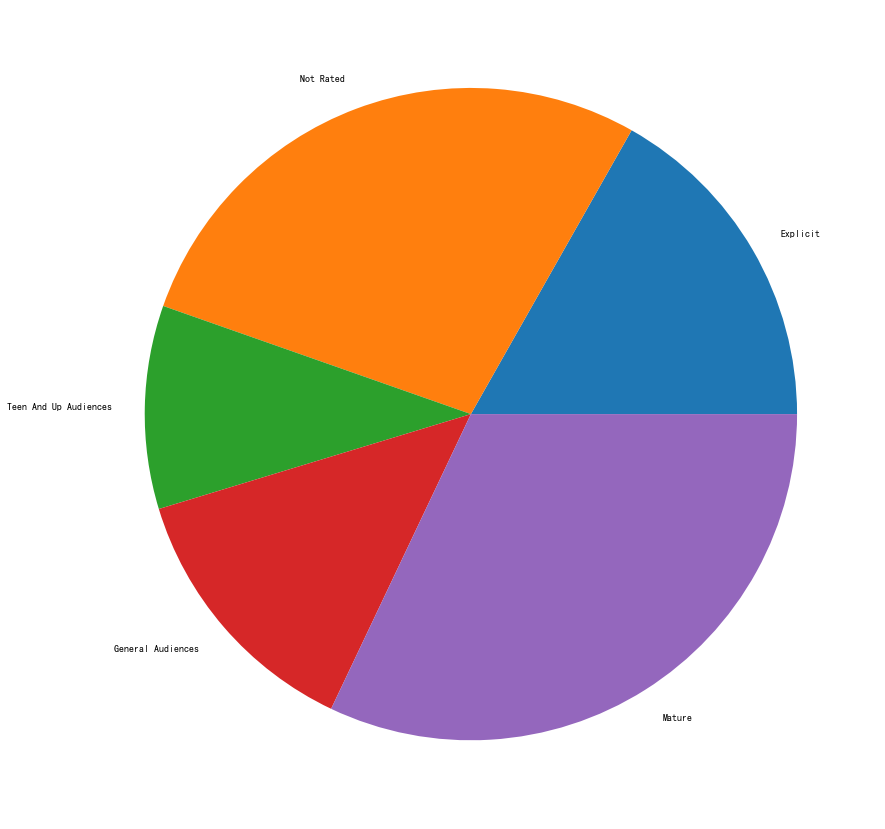

Explicit 16.799270677938008%
Not Rated 27.821979114868224%
Teen And Up Audiences 10.077904856621913%
General Audiences 13.252113376429637%
Mature 32.04873197414222%


In [46]:
#分级标签
tags = [k for k in rating_article_dict.keys()]
#数值：文章数 2
values = [v[2] for v in rating_article_dict.values()]

#绘制饼图
plt.figure(figsize=(15,15)) 
plt.pie(x=values, labels=tags)
plt.show()

for t,v in zip(tags, values):
    print(t+" "+str(v*100.0/np.sum(values))+"%")

### 写作时间统计

我将中文文章写作时间按月统计，注意这个曲线是当月发布的数量，而不是累加值，可见平台中文文章发布增长量非常可观。特别值得注意的是，2020年最后的发布数量突然在最近剧烈下降，因此是被墙对于中文区内容的文章发布数量影响还是很大的。

(代码去除了当前月份的数据统计)从另一个角度去解释2020年1月的中文文章发表数量是以往最高月份的一倍以上，这样激增的发文数量是否也是导致被针对的原因，值得思考。

2020-03 Not Contained 


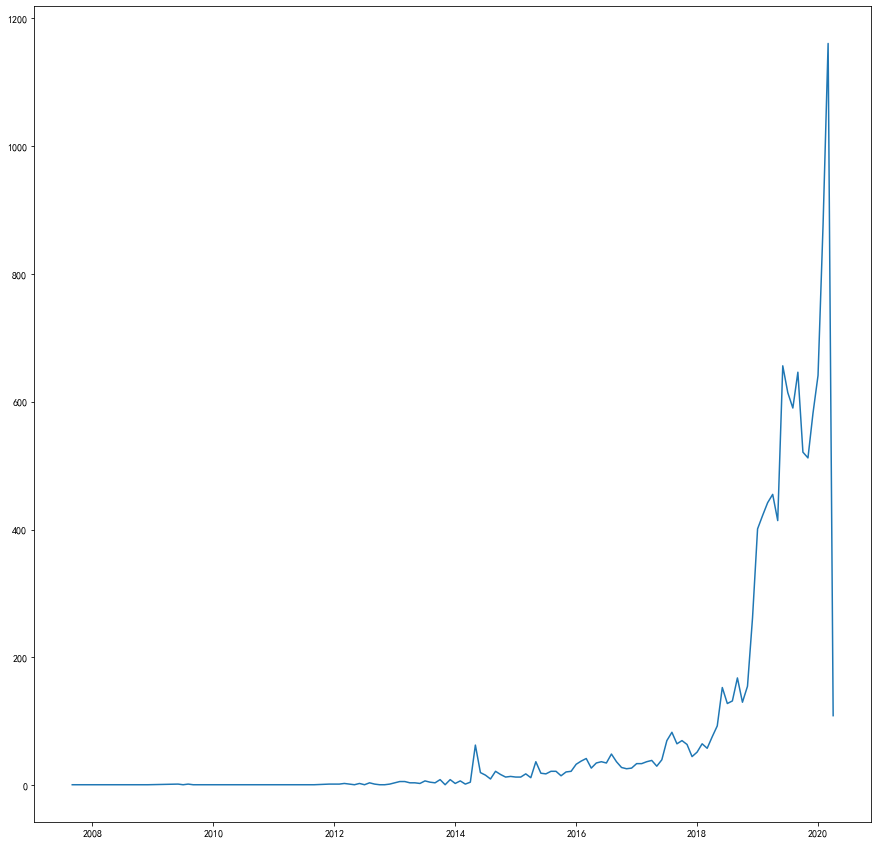

In [11]:
#时间标签处理
#删掉当前月份发布的文章以免影响趋势判断
mounth_now = time.strftime('%Y-%m',time.localtime(time.time()))
if rating_article_dict.__contains__(mounth_now):
    print("Contain: "+mounth_now)
    rating_article_dict.pop(mounth_now)
else:
    print(mounth_now+" Not Contained ")
times = []
conts = []
for k,v in date_cnt_dict.items():
    k_elem = k.split("-")
    times.append(float(k_elem[0])+float(k_elem[1])/12)
    conts.append(v)
    
sorted_times = []
sorted_conts = []
sortindex = np.argsort(times)
for i in range(len(times)):
    sorted_times.append(times[sortindex[i]])
    sorted_conts.append(conts[sortindex[i]])
    
plt.figure(figsize=(15,15))   
plt.plot(sorted_times, sorted_conts)
plt.show()

## 无敏感词文章统计

AO3拥护者们和目前最核心的争论焦点是，平台所提供标签制度，因此在阅读前就可以有读者决定是否阅读。那么下一步就对各个标签下是否有敏感词进行一下统计。

首先我们定义一下敏感词，本文使用的敏感词库来自 https://github.com/chason777777/mgck （感谢作者），只使用了涉及黄的词库。

此次的提取方法是直接敏感词进行计数，这个做起来简单方便。问题是有些正常的词连接在一起可能会被误识别，但一方面我不是NLP专家且时间有限，另一方面有些正常的词汇组合在一起也会产生奇妙的意思。这样此消彼长，加上样本量也比较大。这一点上面，欢迎各位探讨。

敏感词的计数方法是：1、单一文章中包含相关敏感词，则计数+1；2、相同文章中，一模一样的敏感词进行数量累计； 3、基于以上计数方式，单一文章中，若包敏感词小于5个则标记为无敏感词文章。

下图显示了无敏感文章数量与总文章数量的对比情况。

可以看到的是，不同分级标签的敏感词分布确实不同，也符合分级标签的含义，但是现有标签的分类及预警作用是有限的，作者并不绝对遵守规则。

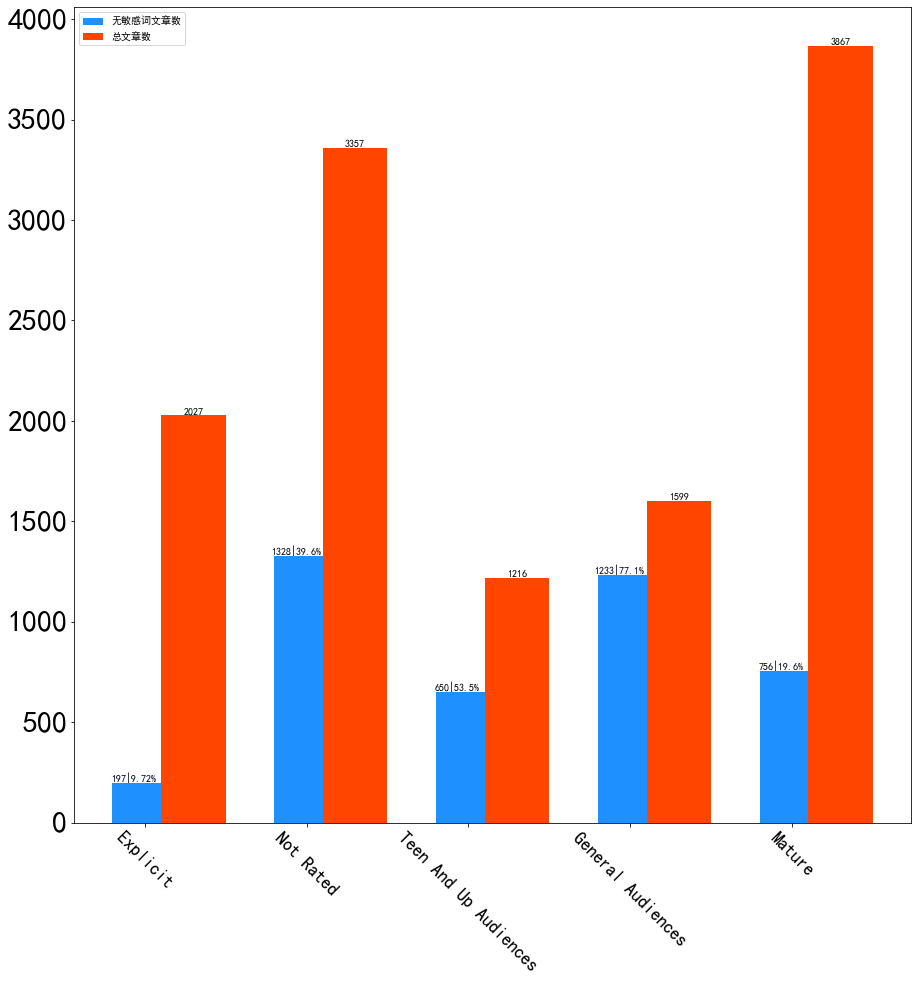

In [12]:
#分级标签
tags = [k for k in rating_article_dict.keys()]
#数值：文章数 2 无敏感词文章数 4
values0 = [v[4] for v in rating_article_dict.values()]
values1 = [v[2] for v in rating_article_dict.values()]

#画条形图
x = np.arange(len(tags))
bar_width = 0.3

plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=18,rotation=-45)
plt.yticks(fontsize=30)
a = plt.bar(x, values0, 0.4, color='dodgerblue', label='无敏感词文章数', align='center')
b = plt.bar(x + bar_width, values1, 0.4, color='orangered', label='总文章数', align='center')
# 设置标签
for i,j in zip(a,b):
    ih = i.get_height()
    jh = j.get_height()
    plt.text(i.get_x()+i.get_width()/3, ih, '{}|{:.3}%'.format(int(ih),float(ih)*100/float(jh)), ha='center', va='bottom')
    plt.text(j.get_x()+j.get_width()/2, jh, '{}'.format(int(jh)), ha='center', va='bottom')

plt.xticks(x,tags)
plt.legend(loc=2)
plt.show()


### 敏感词数量的分布

接下来，是将敏感词的数量与文章内总词量进行一个对比。

这一次的技术方式，是检索文章中重复出现的敏感词，即使重复也会进行累加，然后用敏感词的词数除以文章总词数，将得到敏感词在文章中的词数占比情况。

文章敏感词总词数占比，按标签划分统计出来，结果如下图：

大家可能会感觉 1% 这个比例比较小。但是我在这里分析一下 1%代表者每100个词（约260字）就会出现一个敏感词，再加上围绕这些敏感词前前后后的无害词的衬托，这个比例已经非常大了。如果从NLP的方向统计应该会更恐怖，可惜这个方向我并不熟悉。后期需要持续学习，不断优化分析角度。

可能这样的解释，有点绕，还是上图吧。


天色渐渐晚了，街道一片昏暗。他们好不容易找到一家旅馆。这个旅馆不大，但也精致。他们办好了手续进入了房间，这个房间十分幽暗狭小。但两人似乎并不在意，甚至有些期盼。他望着她，看的她十分害羞，不知过了多久，他突然将她一把搂在怀里。这一下让她措手不及，满脸通红，心向小鹿一样乱撞。此时他顾不了那么多，直接吻了过去。此时此刻，她脑中一片空白，只剩下温柔。他们就这样慢慢移动到床边。躺下身去，他温柔的帮她褪去衣服。

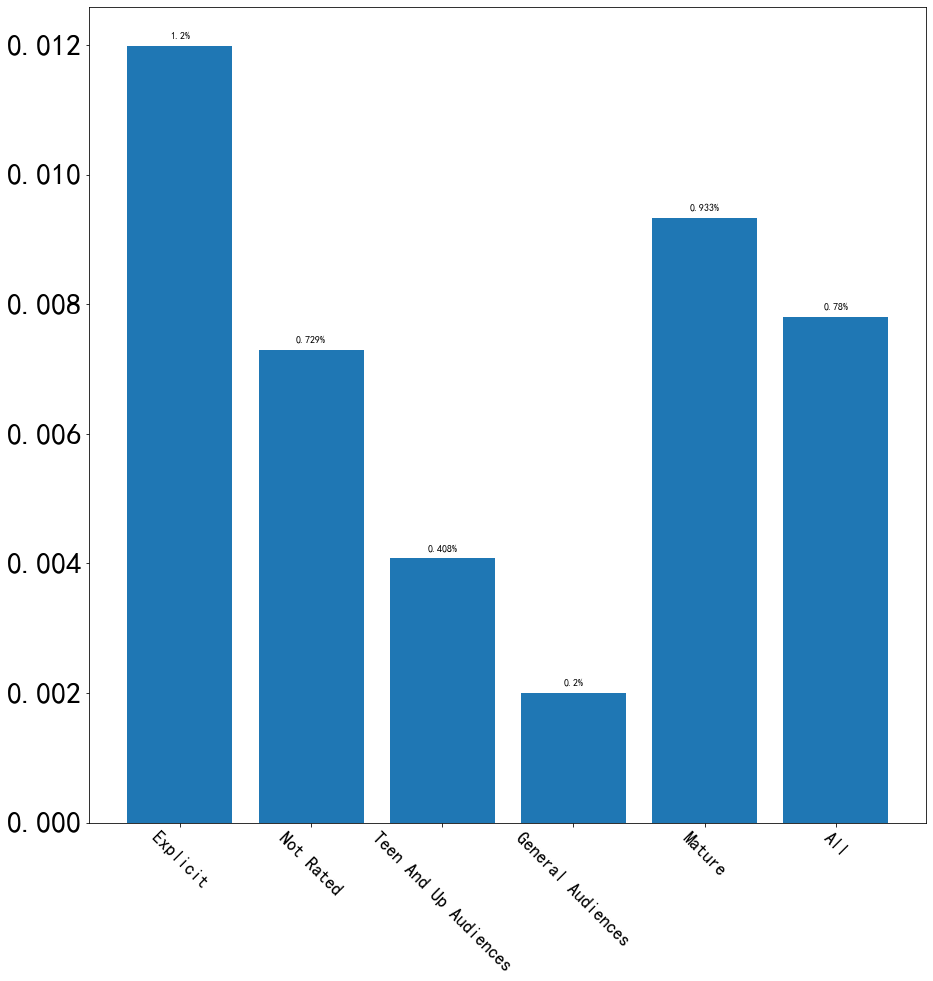

In [13]:
#分级标签
tags = [k for k in rating_article_dict.keys()]
tags.append("All")
#数值：敏感词数 除以 总词数
values = [v[1]/s[1] for v,s in zip(rating_sens_word_dict.values(), rating_article_dict.values())]
values.append(len(sens_word_str.split())/all_article_str_cnt)
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=18,rotation=-45)
plt.yticks(fontsize=30)
plt.bar(tags, values)
for a,b in zip(tags, values):
    plt.text(a, b+0.0001, '{:.3}%'.format(b*100), ha='center', va='bottom')



## 创建并显示词云

想了解敏感词统计是否合理还有一个简单的方法就是使用词云，也就是将高频的词展示出来。这里只做了两种词云：
* **普通词云:** 对文章总体词语进行词云统计，其中部分常用词被过滤（例如：你我他如果但是因为所以）；
* **敏感词云:** 对文章涉及的敏感词进行词云统计。

在生成词云的时候，我将一些人名，称呼，常用词等等词汇进行了过滤（以下称为过滤词）。  
当词云显示出来的时候，我只能说闪瞎双眼了。为了能够展示给大家，我对一部分词进行了替换，如何替换的可以查看代码。

替换是按照单字进行替换的，为了能发出来给大家看只有这样了，在设置替换表时，部分敏感单字我使用了 utf-8 编码替换以免有碍观瞻。

如果想看原词，将 harm_text 的 ignore 参数设置为 Ture 即可。

In [36]:
def code_utf8(dic):
    for key in dic.keys():
        uc = key.encode('unicode_escape').decode('utf-8')
        print(key + " || " + uc + " || " + uc.encode('utf-8').decode('unicode_escape'))

#不需要请注释下方
hrmonious = {}
hrmonious['\\u5988'.encode('utf-8').decode('unicode_escape')] = 'M' 
hrmonious['\\u5c04'.encode('utf-8').decode('unicode_escape')] = 'S'
hrmonious['\\u5a4a'.encode('utf-8').decode('unicode_escape')] = 'B'
hrmonious['\\u75f4'.encode('utf-8').decode('unicode_escape')] = 'C'
hrmonious['\\u4e73'.encode('utf-8').decode('unicode_escape')] = 'R'
hrmonious['\\u5978'.encode('utf-8').decode('unicode_escape')] = 'J'
hrmonious['\\u6027'.encode('utf-8').decode('unicode_escape')] = 'X'
hrmonious['\\u88f8'.encode('utf-8').decode('unicode_escape')] = 'L'
hrmonious['阴'] = 'L'
hrmonious['\\u7a74'.encode('utf-8').decode('unicode_escape')] = 'X'
hrmonious['\\u8361'.encode('utf-8').decode('unicode_escape')] = 'D'
hrmonious['鸡'] = 'Ji'
hrmonious['\\u830e'.encode('utf-8').decode('unicode_escape')] = 'J'
hrmonious['\\u6deb'.encode('utf-8').decode('unicode_escape')] = 'Yin'
hrmonious['\\u6170'.encode('utf-8').decode('unicode_escape')] = 'W'
hrmonious['高'] = 'H'
hrmonious['爱'] = 'I'
hrmonious['头'] = 'T'
hrmonious['内'] = 'N'
hrmonious['插'] = 'C'
hrmonious['情'] = 'Q'
hrmonious['春'] = 'C'
hrmonious['\\u9f9f'.encode('utf-8').decode('unicode_escape')] = 'G'
hrmonious['脱'] = 'T'
hrmonious['教'] = 'Jiao'
hrmonious['做'] = 'Do'
hrmonious['阳'] = 'Y'
hrmonious['潮'] = 'C'
hrmonious['呻'] = 'S'
hrmonious['摩'] = 'M'
hrmonious['交'] = 'J'
hrmonious['下'] = 'Xia'
hrmonious['抽'] = 'Cou'
hrmonious['感'] = 'Gan'
hrmonious['色'] = 'Coo'
hrmonious['液'] = 'Ye'
hrmonious['调'] = 'T'
hrmonious['水'] = 'S'
hrmonious['按'] = 'An'
hrmonious['道'] = 'Dao'
hrmonious['叫'] = 'Jiao'
hrmonious['激'] = 'Ji'
hrmonious['\\u68d2'.encode('utf-8').decode('unicode_escape')] = 'Bar'
hrmonious['体'] = 'Ti'
hrmonious['嫩'] = 'Nen'
hrmonious['肉'] = 'R'
hrmonious['丝'] = 'S'
hrmonious['吟'] = 'Y'
hrmonious['庭'] = 'T'
hrmonious['奶'] = 'N'
code_utf8(hrmonious)

妈 || \u5988 || 妈
射 || \u5c04 || 射
婊 || \u5a4a || 婊
痴 || \u75f4 || 痴
乳 || \u4e73 || 乳
奸 || \u5978 || 奸
性 || \u6027 || 性
裸 || \u88f8 || 裸
阴 || \u9634 || 阴
穴 || \u7a74 || 穴
荡 || \u8361 || 荡
鸡 || \u9e21 || 鸡
茎 || \u830e || 茎
淫 || \u6deb || 淫
慰 || \u6170 || 慰
高 || \u9ad8 || 高
爱 || \u7231 || 爱
头 || \u5934 || 头
内 || \u5185 || 内
插 || \u63d2 || 插
情 || \u60c5 || 情
春 || \u6625 || 春
龟 || \u9f9f || 龟
脱 || \u8131 || 脱
教 || \u6559 || 教
做 || \u505a || 做
阳 || \u9633 || 阳
潮 || \u6f6e || 潮
呻 || \u547b || 呻
摩 || \u6469 || 摩
交 || \u4ea4 || 交
下 || \u4e0b || 下
抽 || \u62bd || 抽
感 || \u611f || 感
色 || \u8272 || 色
液 || \u6db2 || 液
调 || \u8c03 || 调
水 || \u6c34 || 水
按 || \u6309 || 按
道 || \u9053 || 道
叫 || \u53eb || 叫
激 || \u6fc0 || 激
棒 || \u68d2 || 棒
体 || \u4f53 || 体
嫩 || \u5ae9 || 嫩
肉 || \u8089 || 肉
丝 || \u4e1d || 丝
吟 || \u541f || 吟
庭 || \u5ead || 庭
奶 || \u5976 || 奶


In [51]:
def harm_text(text, ignore=False):
    if ignore:
        return text
    hrmonious = {}
    #不需要请注释下方
    hrmonious['\\u5988'.encode('utf-8').decode('unicode_escape')] = 'M' 
    hrmonious['\\u5c04'.encode('utf-8').decode('unicode_escape')] = 'S'
    hrmonious['\\u5a4a'.encode('utf-8').decode('unicode_escape')] = 'B'
    hrmonious['\\u75f4'.encode('utf-8').decode('unicode_escape')] = 'C'
    hrmonious['\\u4e73'.encode('utf-8').decode('unicode_escape')] = 'R'
    hrmonious['\\u5978'.encode('utf-8').decode('unicode_escape')] = 'J'
    hrmonious['\\u6027'.encode('utf-8').decode('unicode_escape')] = 'X'
    hrmonious['\\u88f8'.encode('utf-8').decode('unicode_escape')] = 'L'
    hrmonious['阴'] = 'Y'
    hrmonious['\\u7a74'.encode('utf-8').decode('unicode_escape')] = 'X'
    hrmonious['\\u8361'.encode('utf-8').decode('unicode_escape')] = 'D'
    hrmonious['鸡'] = 'J'
    hrmonious['\\u830e'.encode('utf-8').decode('unicode_escape')] = 'J'
    hrmonious['\\u6deb'.encode('utf-8').decode('unicode_escape')] = 'Y'
    hrmonious['\\u6170'.encode('utf-8').decode('unicode_escape')] = 'W'
    hrmonious['高'] = 'H'
    hrmonious['爱'] = 'A'
    hrmonious['头'] = 'T'
    hrmonious['内'] = 'N'
    hrmonious['插'] = 'C'
    hrmonious['情'] = 'Q'
    hrmonious['春'] = 'C'
    hrmonious['\\u9f9f'.encode('utf-8').decode('unicode_escape')] = 'G'
    hrmonious['脱'] = 'T'
    hrmonious['教'] = 'J'
    hrmonious['做'] = 'D'
    hrmonious['阳'] = 'Y'
    hrmonious['潮'] = 'C'
    hrmonious['呻'] = 'S'
    hrmonious['摩'] = 'M'
    hrmonious['交'] = 'J'
    hrmonious['下'] = 'X'
    hrmonious['抽'] = 'C'
    hrmonious['感'] = 'G'
    hrmonious['色'] = 'C'
    hrmonious['液'] = 'Y'
    hrmonious['调'] = 'T'
    hrmonious['水'] = 'S'
    hrmonious['按'] = 'A'
    hrmonious['道'] = 'D'
    hrmonious['叫'] = 'J'
    hrmonious['激'] = 'J'
    hrmonious['\\u68d2'.encode('utf-8').decode('unicode_escape')] = 'B'
    hrmonious['体'] = 'T'
    hrmonious['嫩'] = 'N'
    hrmonious['肉'] = 'R'
    hrmonious['丝'] = 'S'
    hrmonious['吟'] = 'Y'
    hrmonious['庭'] = 'T'
    hrmonious['奶'] = 'N'
    hrmonious['屁'] = 'P'
    #不需要请注释上方

    for k,v in hrmonious.items():
        text = text.replace(k,v)
    return text

#创建文章所有词云


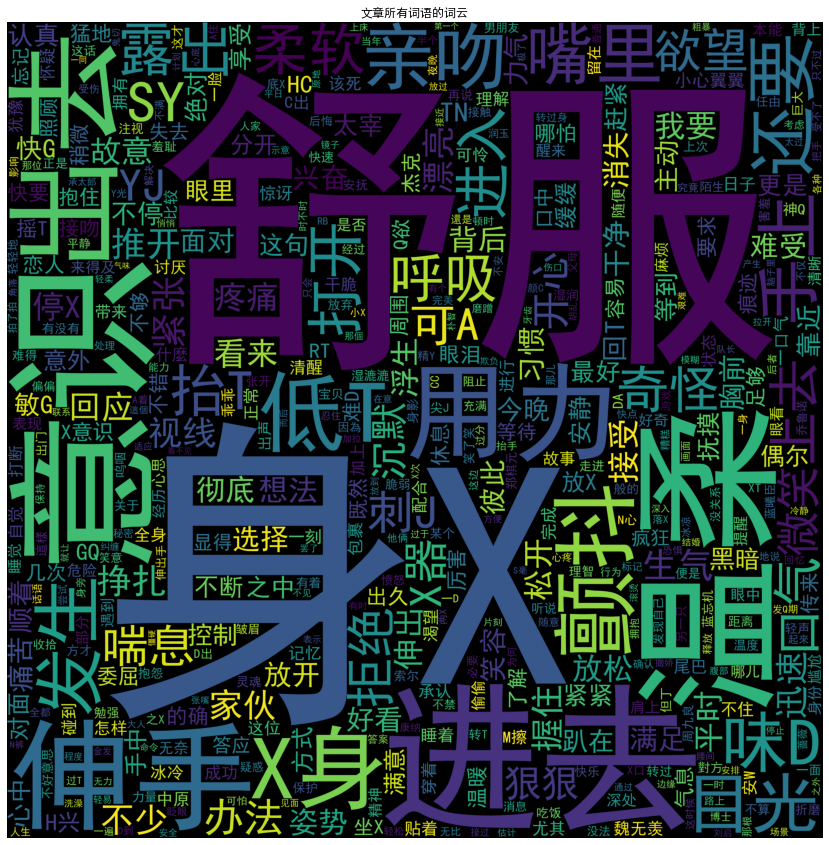

#创建文章所有敏感词的词云


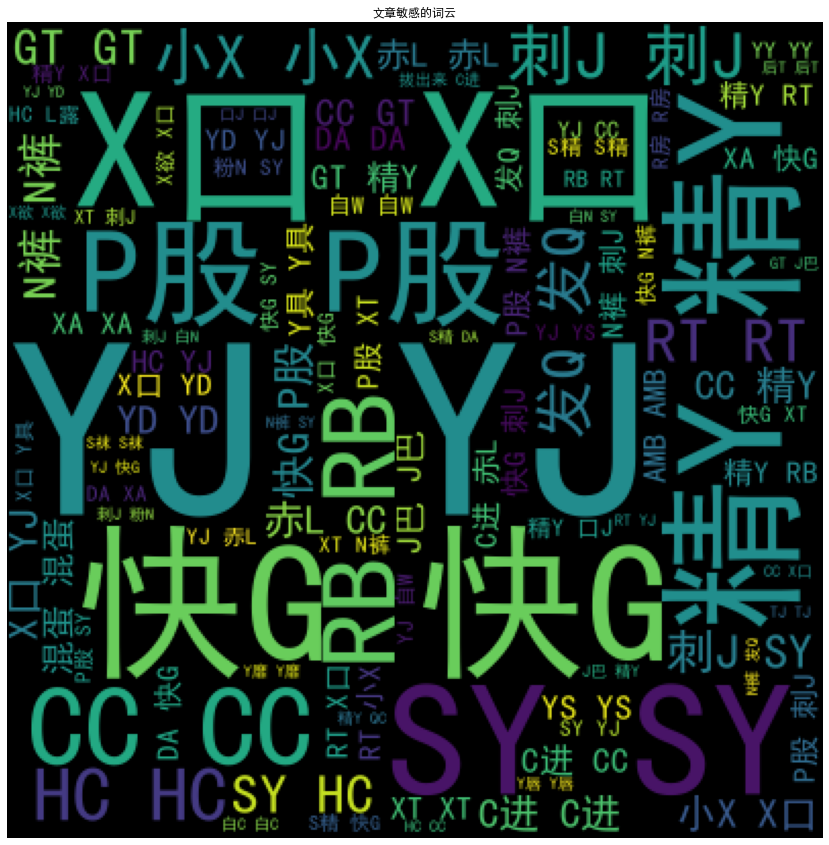

#创建分级文章所有词云


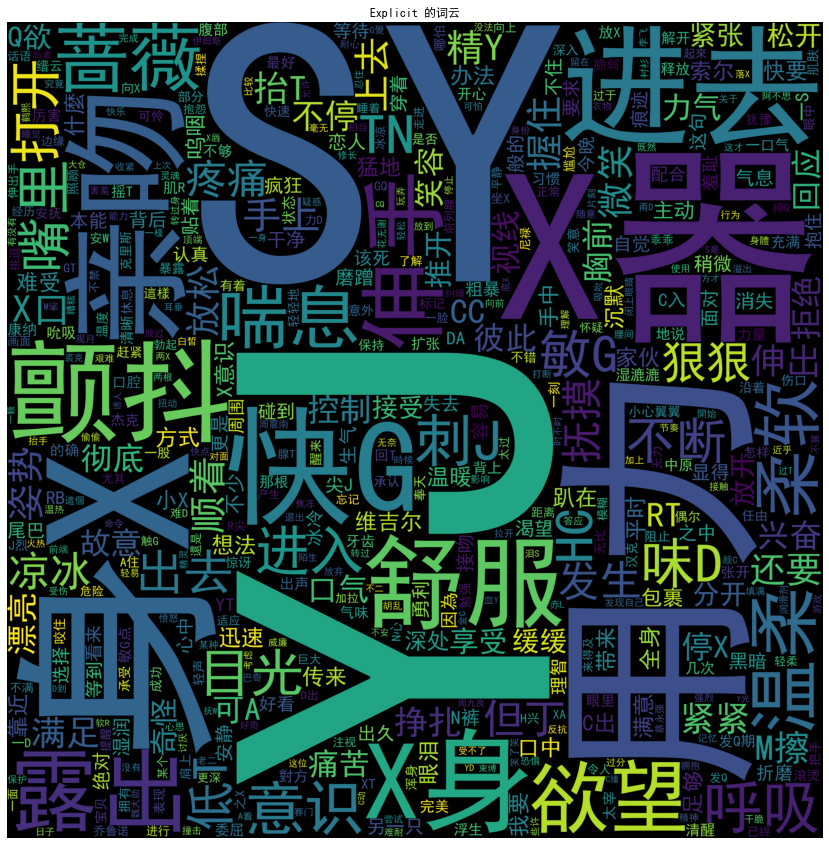

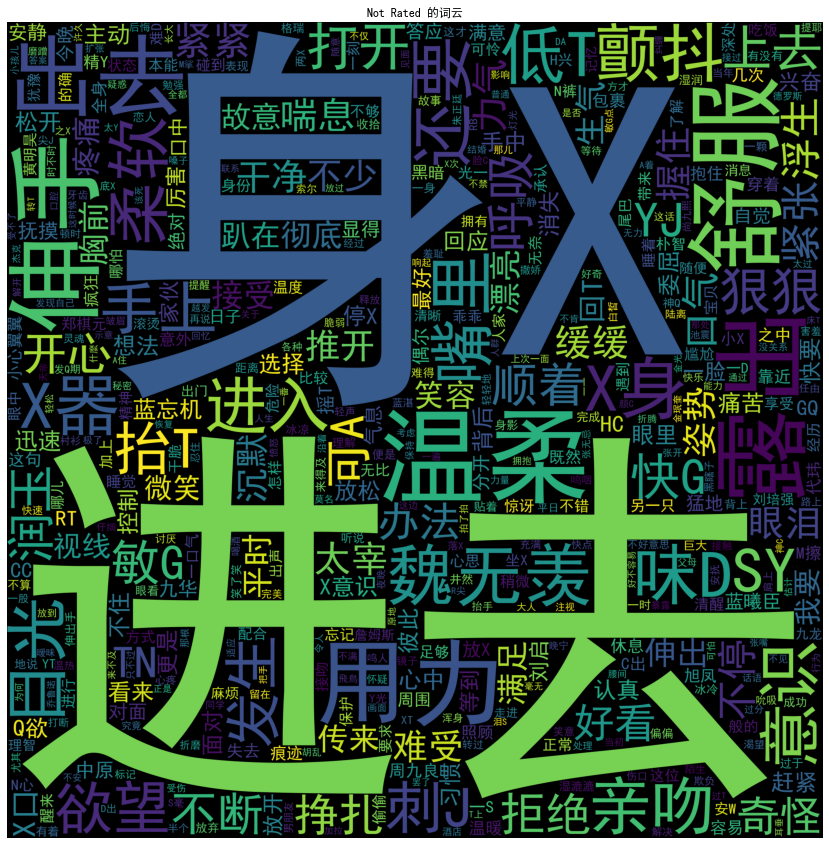

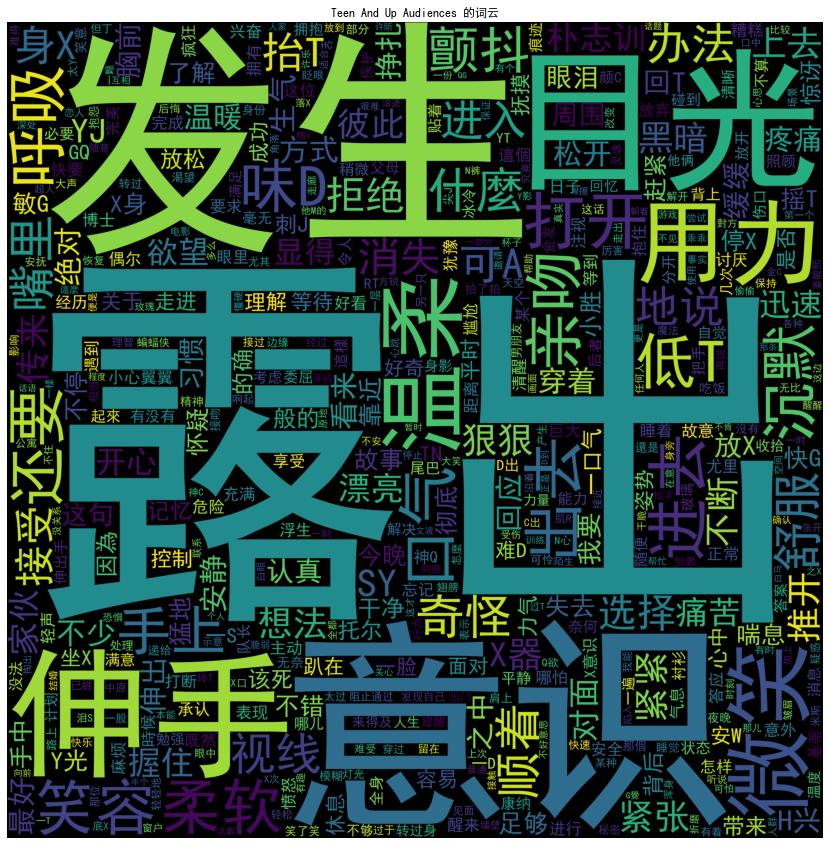

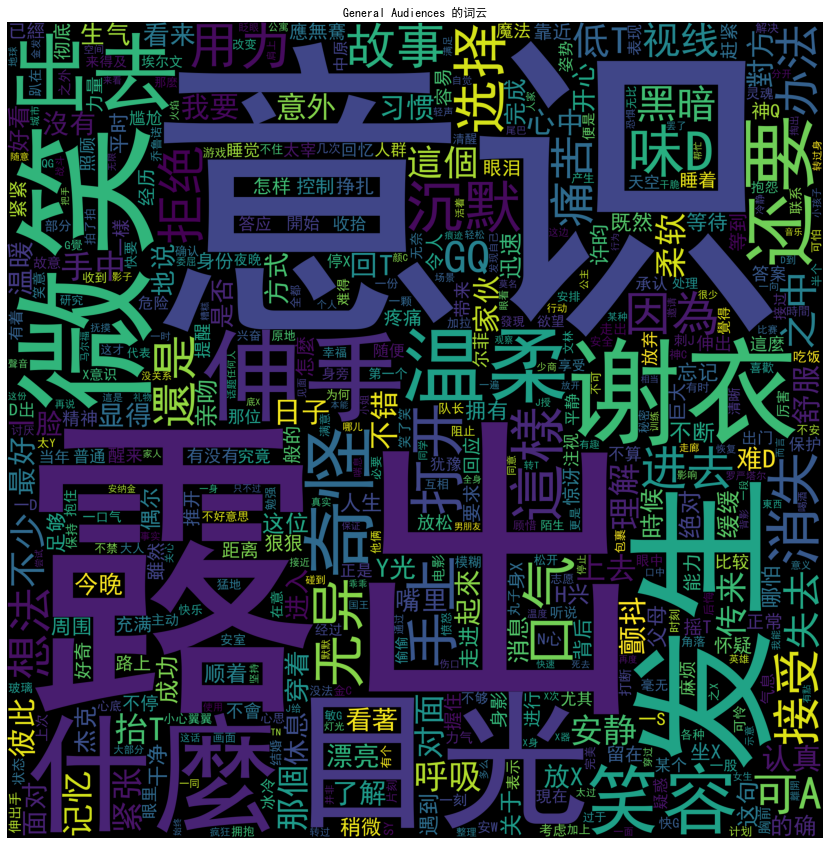

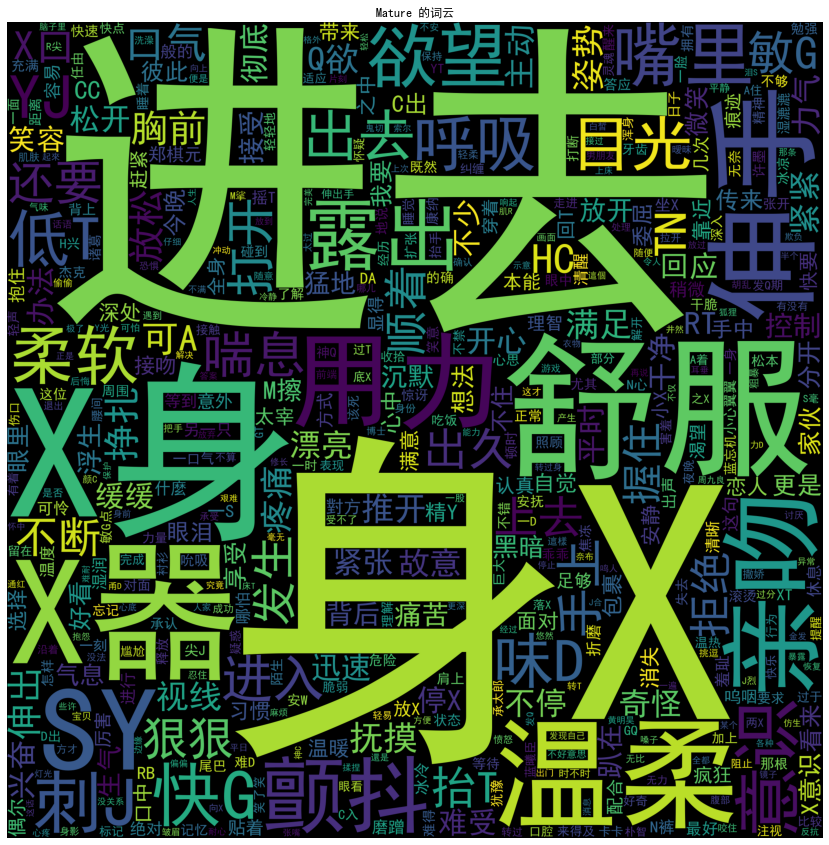

#创建分级文章敏感词的词云


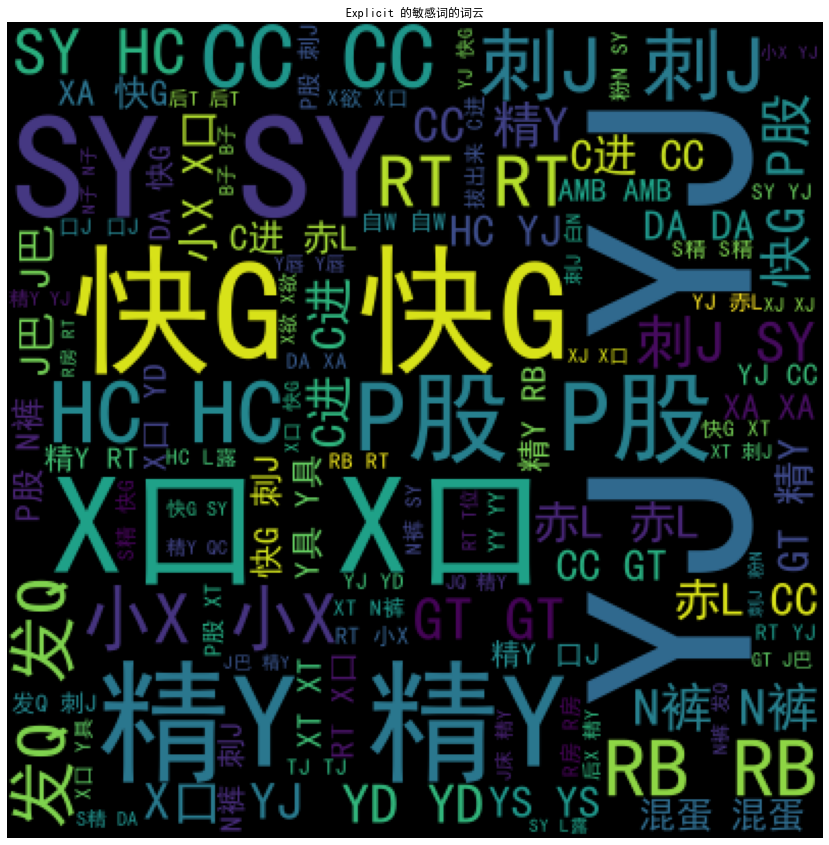

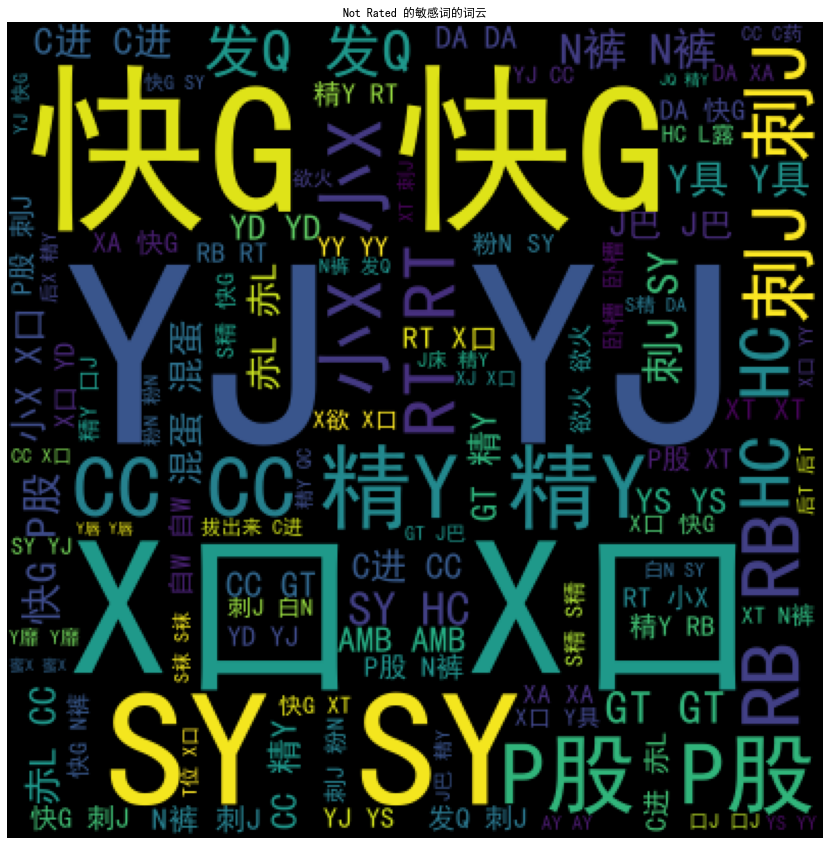

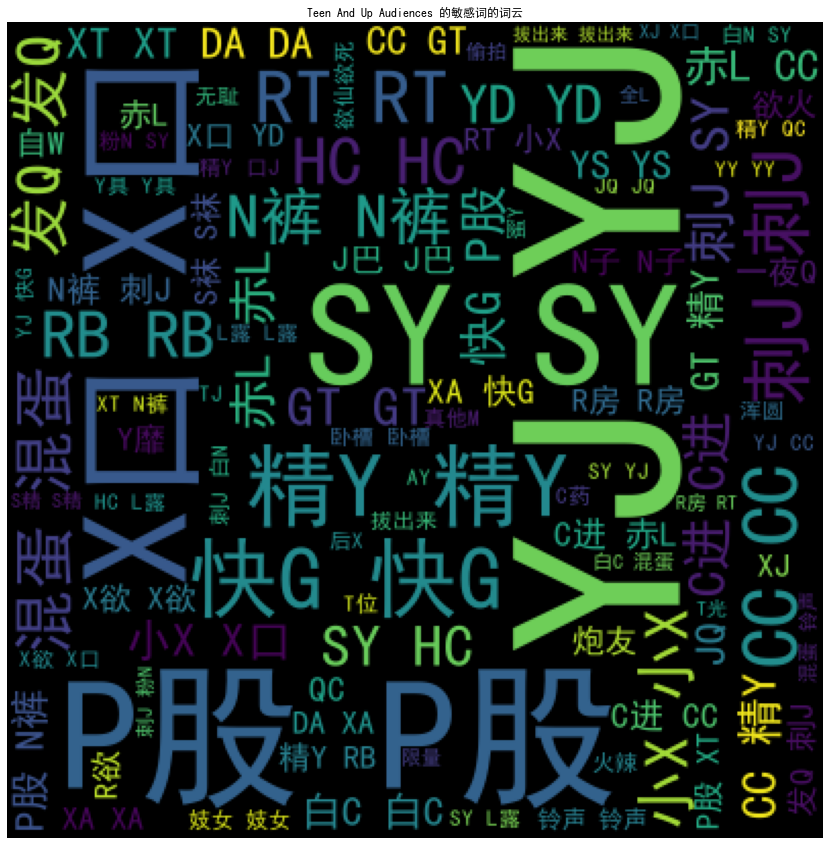

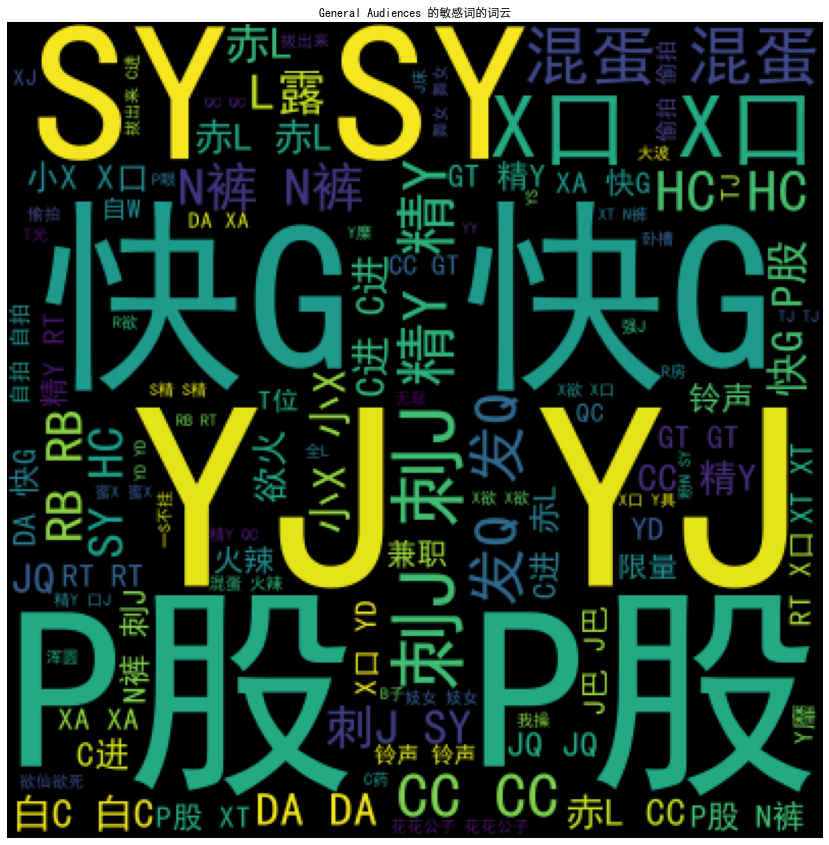

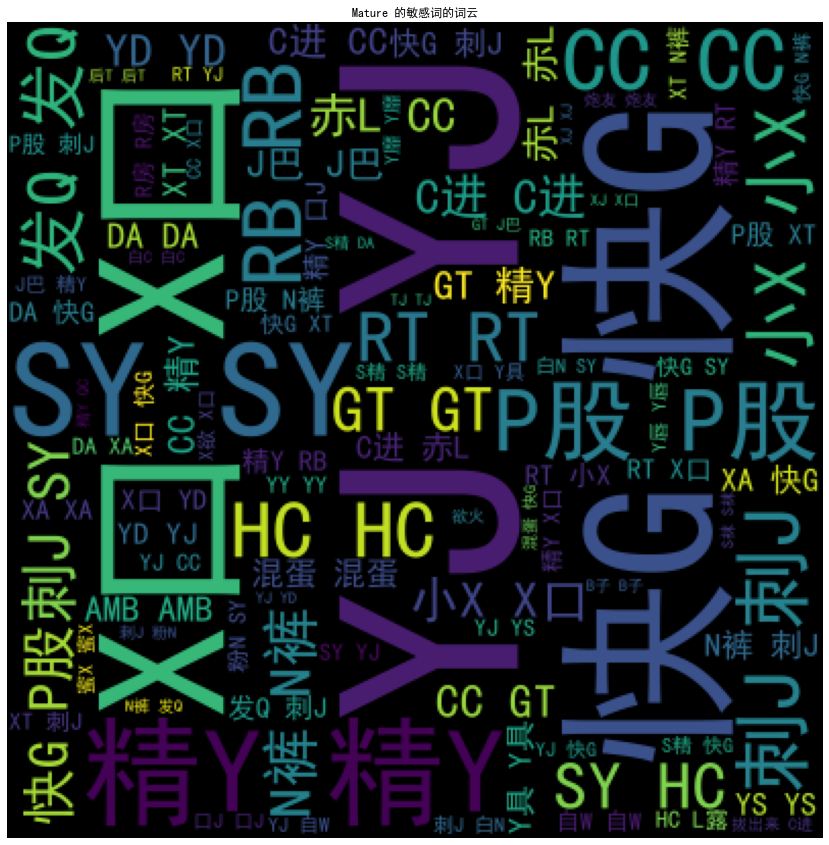

In [52]:
print("#创建文章所有词云")
all_wc = create_word_cloud(harm_text(all_article_str), 500) #"wordcloud.jpg"
plt.figure(figsize=(15,15)) 
plt.imshow(all_wc)
plt.axis("off")
plt.title("文章所有词语的词云")
plt.show()
print("#创建文章所有敏感词的词云")
sens_wc = create_word_cloud(harm_text(sens_word_str),100) #"sens_wordcloud.jpg"
plt.figure(figsize=(15,15)) 
plt.imshow(sens_wc)
plt.axis("off")
plt.title("文章敏感的词云")
plt.show()
print("#创建分级文章所有词云")
for k, word in rating_article_dict.items():
    r_all_wc = create_word_cloud(harm_text(word[0]), 500) #k+"_wordcloud.jpg"
    plt.figure(figsize=(15,15)) 
    plt.imshow(r_all_wc)
    plt.axis("off")
    plt.title(k+" 的词云")
    plt.show()
print("#创建分级文章敏感词的词云")
for k, sens in rating_sens_word_dict.items():
    r_sens_wc = create_word_cloud(harm_text(sens[0]), 100) #k+"_sens_wordcloud.jpg"
    plt.figure(figsize=(15,15)) 
    plt.imshow(r_sens_wc)
    plt.axis("off")
    plt.title(k+" 的敏感词的词云")
    plt.show()

### 点击率对比

分析完平台中文文章，我们现在来看看读者情况。

我们通过每个标签的平均点击率（标签文章点击总数 / 标签文章总数）情况来看看数据。

读者的偏好：限制级别更高的文章，获得了普遍更高的点击率。

<BarContainer object of 5 artists>

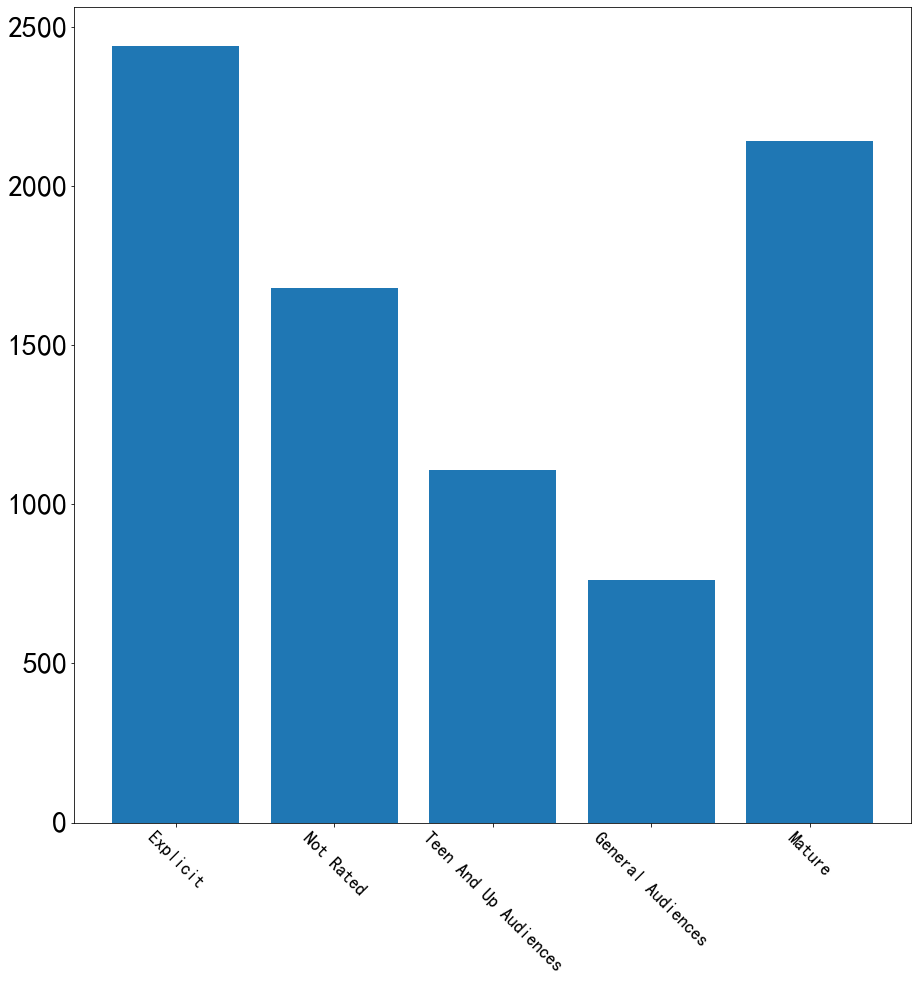

In [17]:
#分级标签
tags = [k for k in rating_article_dict.keys()]
#数值：文章数 2 总点击量 3
values = [v[3]/v[2] for v in rating_article_dict.values()]

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=18,rotation=-45)
plt.yticks(fontsize=30)
plt.bar(tags, values)
# for a,b in zip(tags, values):
#     plt.text(a, b+0.0001, '{:.3}%'.format(b*100), ha='center', va='bottom')

## 查看部分过滤词情况

在词云统计的时候，我手动总结了过滤词，主要针对‘因为你我她他它、常见的语气词形容词副词、人名等’。

由于过滤词是由我多次跑词云并从中挑选的高频词。即我可以一直去除最高频的词直到一些有趣的词率先浮现。在过滤词云的过程中，我发现词云出现了一些有趣的规律。因此，我又对这些过滤词进行了分类：

* 身体部位（不涉及性别）
* 颜色
* 动作
* 地点
* 方向
* 主角
* 人称/称呼
* 物品
* 其他（量词，语气词，形容词，副词等）

我通过两个方法确保过滤词并不会影响本次词云分析的结论：
* 公开所有代码和过滤词（不包括：本次抽取的AO3的中文文库、接下来用于对比使用的其他文学作品以及敏感词库）。这样如果大家对某个词有质疑不公平可以及时指出并讨论，也可以自己运行程序修改、复验、解读；
* 对过滤词进行分析以及横向对比，阐述过滤词的正当性，这里时间有限，横向对比只做了一小部分，后文阐述。

我们首先对平台文章进行分析。

这里需要注意，同一篇文章出现的重复过滤词只算一次，不累加计数。另外过滤词可能出现套娃现象，也就是一个大词可能包含一个小词，这样小词的统计数量就会等于 大词+小词的数量，这里就不再修正了。

## 身体部位

平台文章喜欢描写的一般身体部位

<BarContainer object of 30 artists>

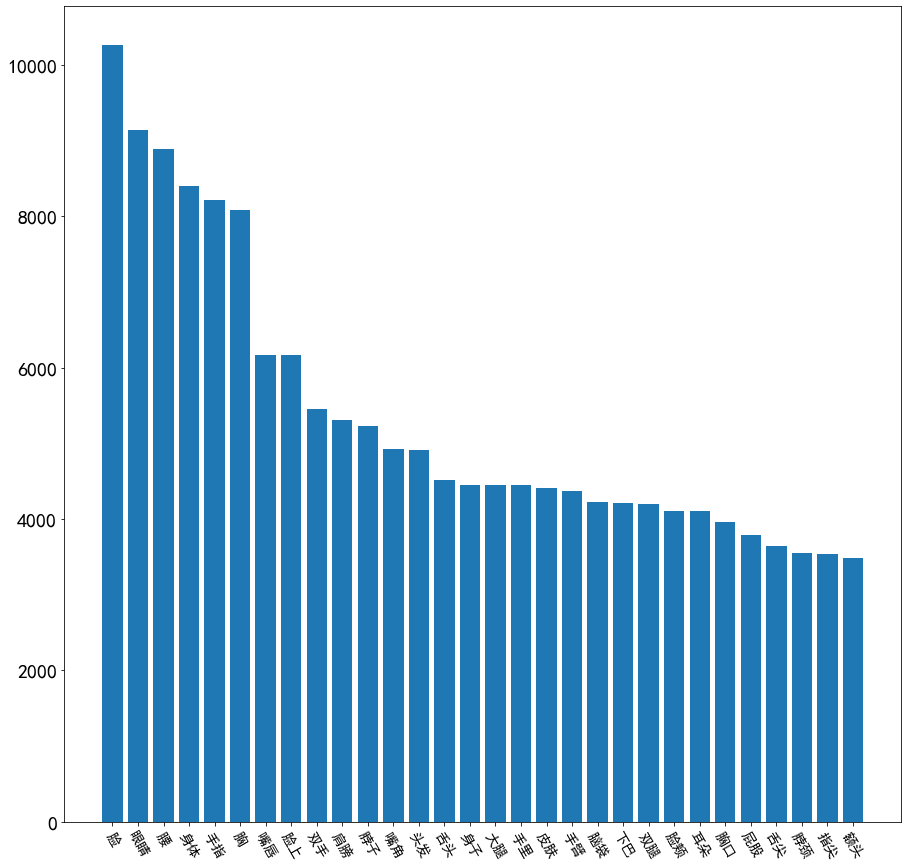

In [54]:
#拆分数据
keys = list(stop_words['bodypart'])
values = list(stop_cnt['bodypart'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1][:30]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 颜色描述

平台喜欢描述的颜色

<BarContainer object of 16 artists>

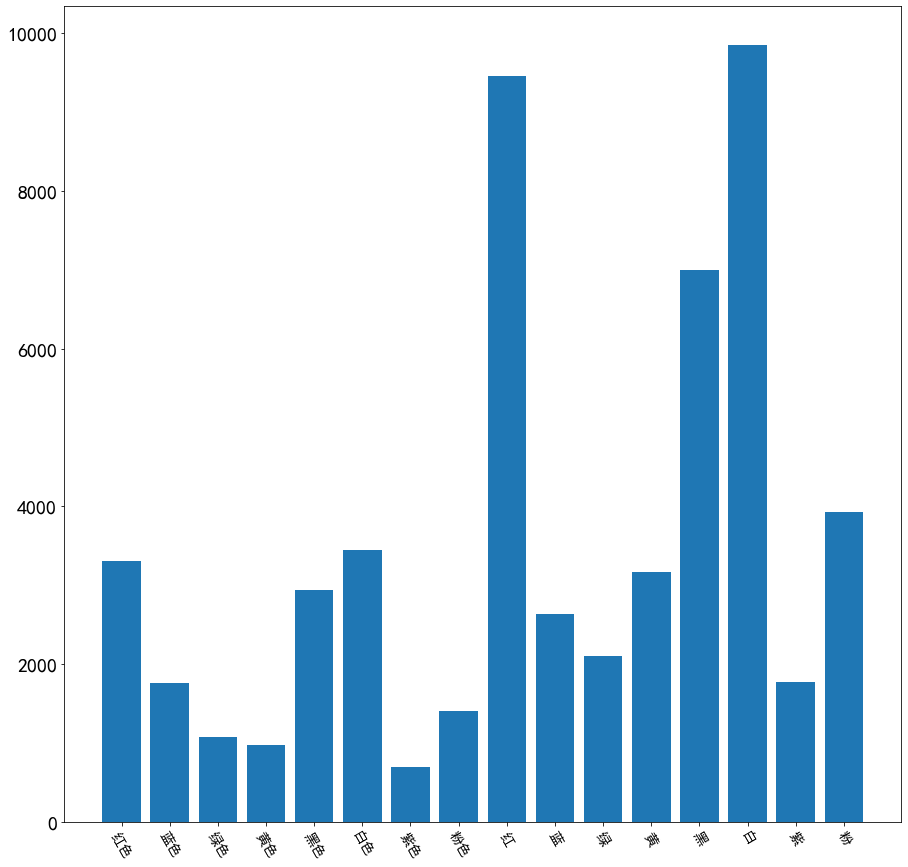

In [19]:
#拆分数据
keys = list(stop_words['color'])
values = list(stop_cnt['color'])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(keys, values)

## 动作描述

平台喜欢使用的动作

<BarContainer object of 36 artists>

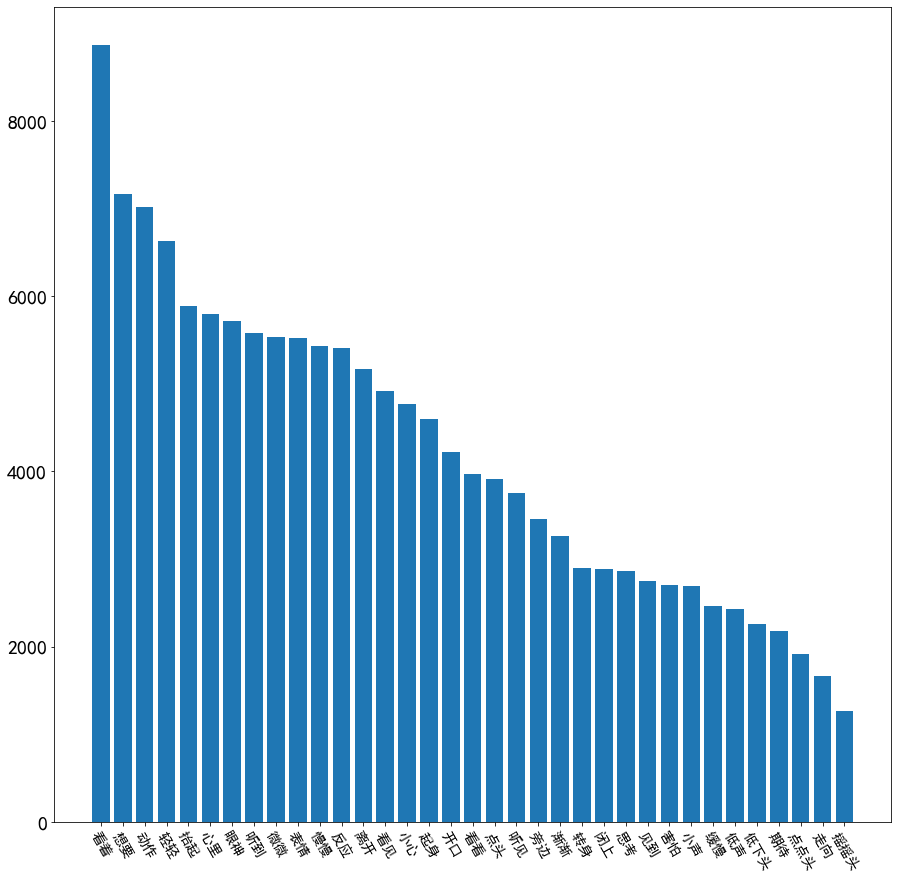

In [20]:
#拆分数据
keys = list(stop_words['motion'])
values = list(stop_cnt['motion'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])
    
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 地点描述

平台喜欢使用的地点位置

<BarContainer object of 28 artists>

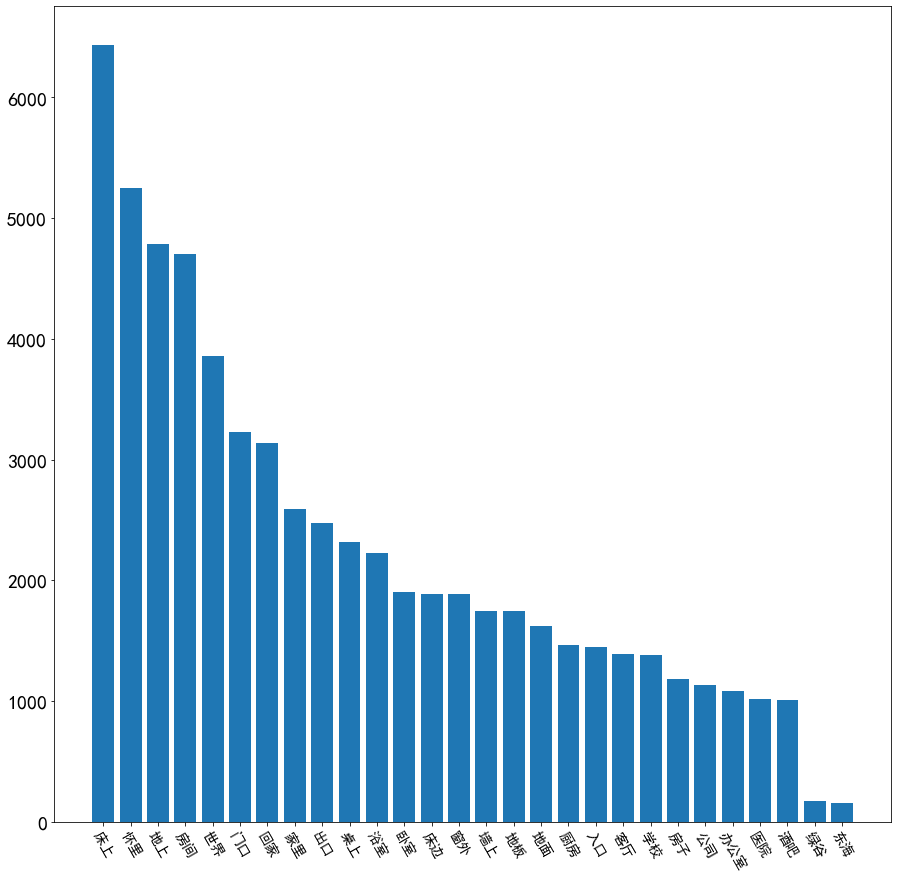

In [21]:
#拆分数据
keys = list(stop_words['site'])
values = list(stop_cnt['site'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 方向描述

平台喜欢使用的方向和相对位置

<BarContainer object of 17 artists>

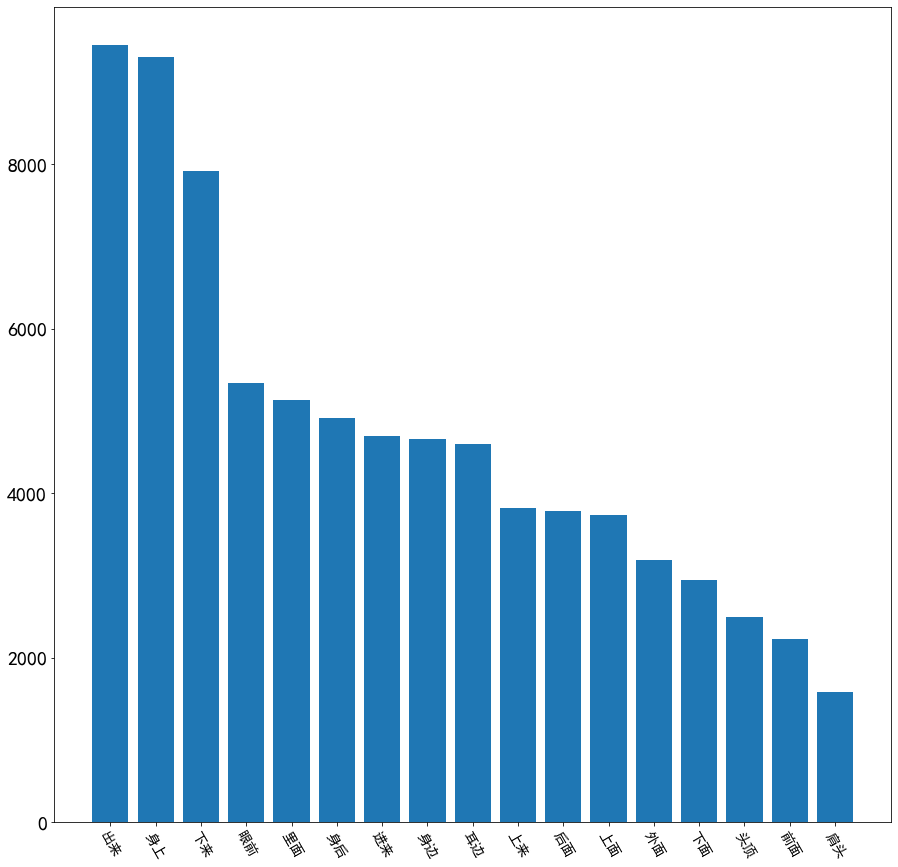

In [22]:
#拆分数据
keys = list(stop_words['orientation'])
values = list(stop_cnt['orientation'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 主角统计
平台喜欢的主角名称，只取了排名Top50。另外值得一提的是，现在词云中浮现的名字出现数量大多数都低于这里出现的名字

<BarContainer object of 30 artists>

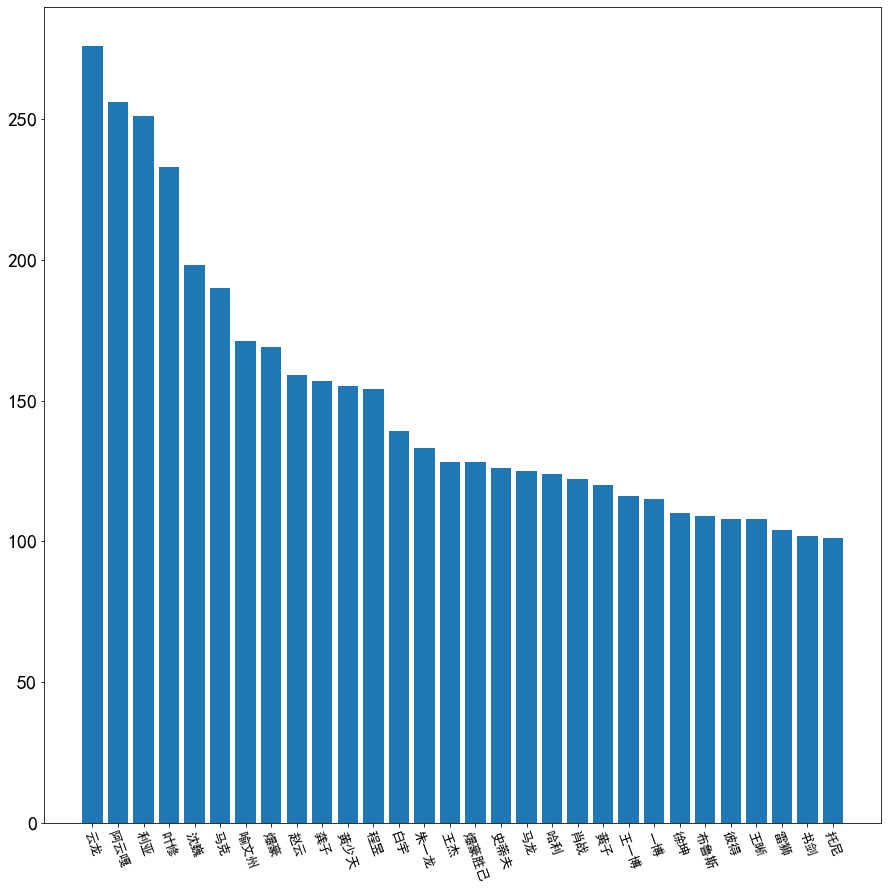

In [55]:
#拆分数据

keys = list(stop_words['role_name'])
values = list(stop_cnt['role_name'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1][:30]
for i in sortindex:
    sub_keys.append(keys[i])
    sub_values.append(values[i])
    
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=13,rotation=-70)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 称呼分析

平台喜欢使用的称呼或人群指代词Top50，不含： 你 我 他 她 自己

<BarContainer object of 30 artists>

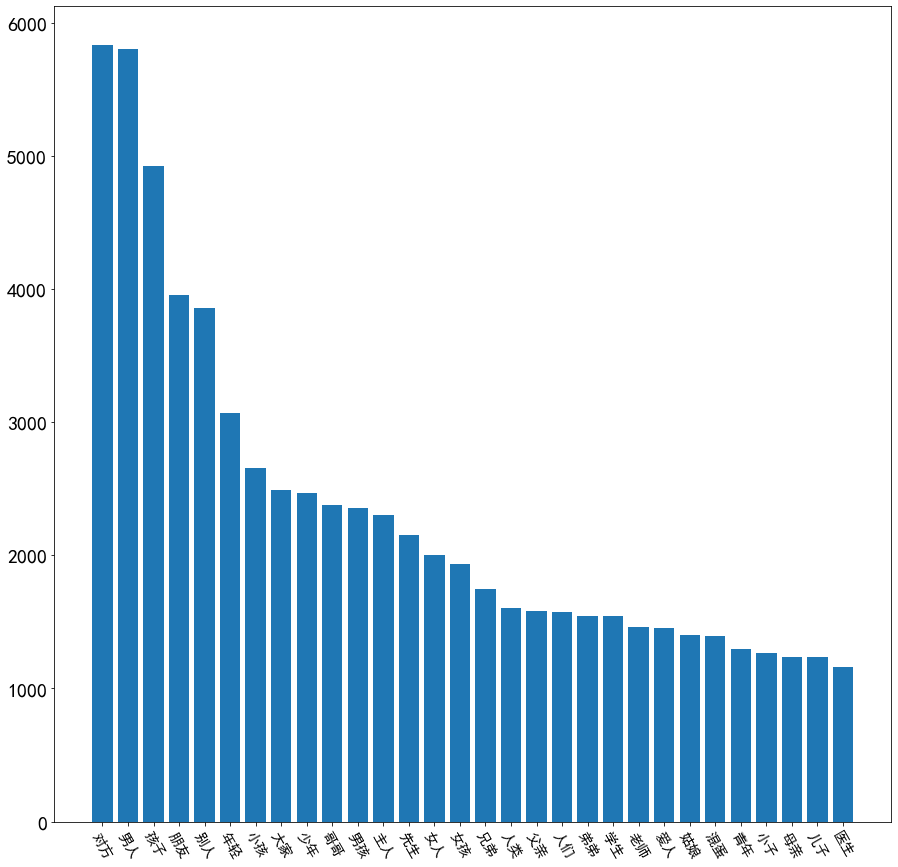

In [56]:
#拆分数据
keys = list(stop_words['title'])
values = list(stop_cnt['title'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1][:30]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

## 物体分析

平台喜欢使用的物品，只取了词云里浮现出来的，所以很少。

<BarContainer object of 17 artists>

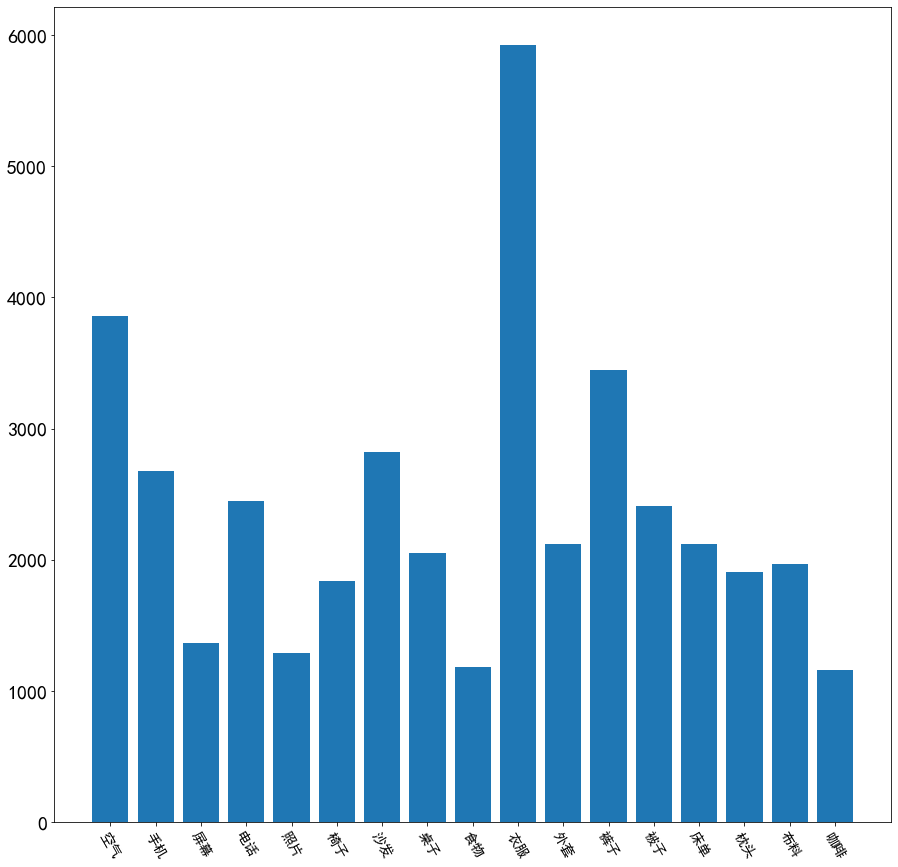

In [25]:
#拆分数据
bodyparts = list(stop_words['thing'])
values = list(stop_cnt['thing'])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(bodyparts, values)

## 横向对比

由于实在没有时间和精力去爬另外的文章网站，所以这里主要是一个抛砖引玉的作用，有兴趣的小伙伴可以自己做一做。同时也想提问一下做NLP的同学们，难道没有用于训练的中文散文库么？找了两天根本没找到。

简化期间，根据AO3拥护者的呼声，我们挑选四部中外名著（最后一篇是我自己加的，古今名副其实的 LOL）：**《羊脂球》、《百年孤独》、《红楼梦》、《金瓶梅》**

查看过代码的话，大家应该能够看到，点击率，日期是无法统计的，分级标签替换为书名。书的内容不需要html处理。其余数据分析与上面一致。


In [26]:
books_path = "books/"
books_pbar = tqdm(os.listdir(books_path))

  0%|          | 0/4 [00:00<?, ?it/s]

In [27]:
all_book_str = "" #所有文字
all_book_str_cnt = 0
book_sens_word_str = "" #包含的所有敏感词
title_book_dict = {} #按照书名保存的文字
title_sens_word_dict = {} #按照分级保存的包含敏感词
book_stop_cnt = {} #过滤词的计数
for key, words in stop_words.items():
        book_stop_cnt[key] = np.zeros(len(words)) #创建向量

In [28]:
for book in books_pbar:
    book_path = os.path.join(books_path,book)
    with open(book_path) as f:
        book_str = f.read() #读取文章
    #这里直接分析就好
    book_str, book_cnt, sub_stop_cnt, sub_sens_word_buf = analyze_text(book_str)
    all_book_str += book_str #所有文章文字融合
    all_book_str_cnt += book_cnt #所有词语数量加和
    
    #为每个过滤词添加计数
    for sc, sub_sc in zip(book_stop_cnt.values(), sub_stop_cnt.values()):
        sc += sub_sc
        
    #所有敏感词融合
    for swlist in sub_sens_word_buf:
        for s in range(swlist[1]):
            book_sens_word_str += swlist[0] + " "

    #按书名文章
    if not title_book_dict.__contains__(book): #不存在则创建一个
        # 文本，总词数，文章数（废），总点击量（废），无敏感词文章
        title_book_dict[book] = ["",0,0,0,0]
        # 敏感词集合，总敏感词数
        title_sens_word_dict[book] = ["",0]

    title_book_dict[book][0] += book_str + " "
    title_book_dict[book][1] += book_cnt
    title_book_dict[book][2] += 1
    title_book_dict[book][3] += 1
    #敏感词小于一定数量
    if len(sub_sens_word_buf) < 5:
        title_book_dict[book][4] += 1
    for swlist in sub_sens_word_buf:
        for s in range(swlist[1]): #敏感词重复也计入
            title_sens_word_dict[book][0] += swlist[0] + " "
            title_sens_word_dict[book][1] += 1

100%|██████████| 4/4 [00:23<00:00,  5.92s/it]


## 无敏感词文章统计

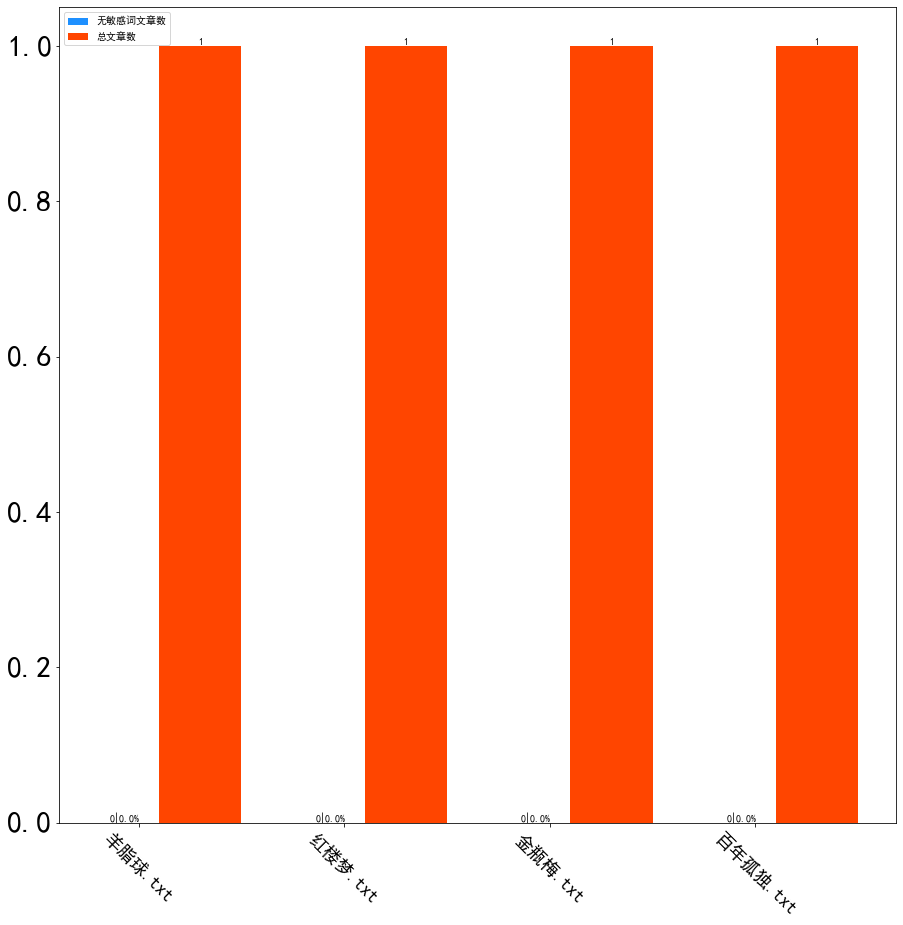

In [29]:
#分级标签
tags = [k for k in title_book_dict.keys()]
#数值：文章数 2 无敏感词文章数 4
values0 = [v[4] for v in title_book_dict.values()]
values1 = [v[2] for v in title_book_dict.values()]

#画条形图
x = np.arange(len(tags))
bar_width = 0.3

plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=18,rotation=-45)
plt.yticks(fontsize=30)
a = plt.bar(x, values0, 0.4, color='dodgerblue', label='无敏感词文章数', align='center')
b = plt.bar(x + bar_width, values1, 0.4, color='orangered', label='总文章数', align='center')
# 设置标签
for i,j in zip(a,b):
    ih = i.get_height()
    jh = j.get_height()
    plt.text(i.get_x()+i.get_width()/3, ih, '{}|{:.3}%'.format(int(ih),float(ih)*100/float(jh)), ha='center', va='bottom')
    plt.text(j.get_x()+j.get_width()/2, jh, '{}'.format(int(jh)), ha='center', va='bottom')

plt.xticks(x,tags)
plt.legend(loc=2)
plt.show()


### 敏感词数量的分布

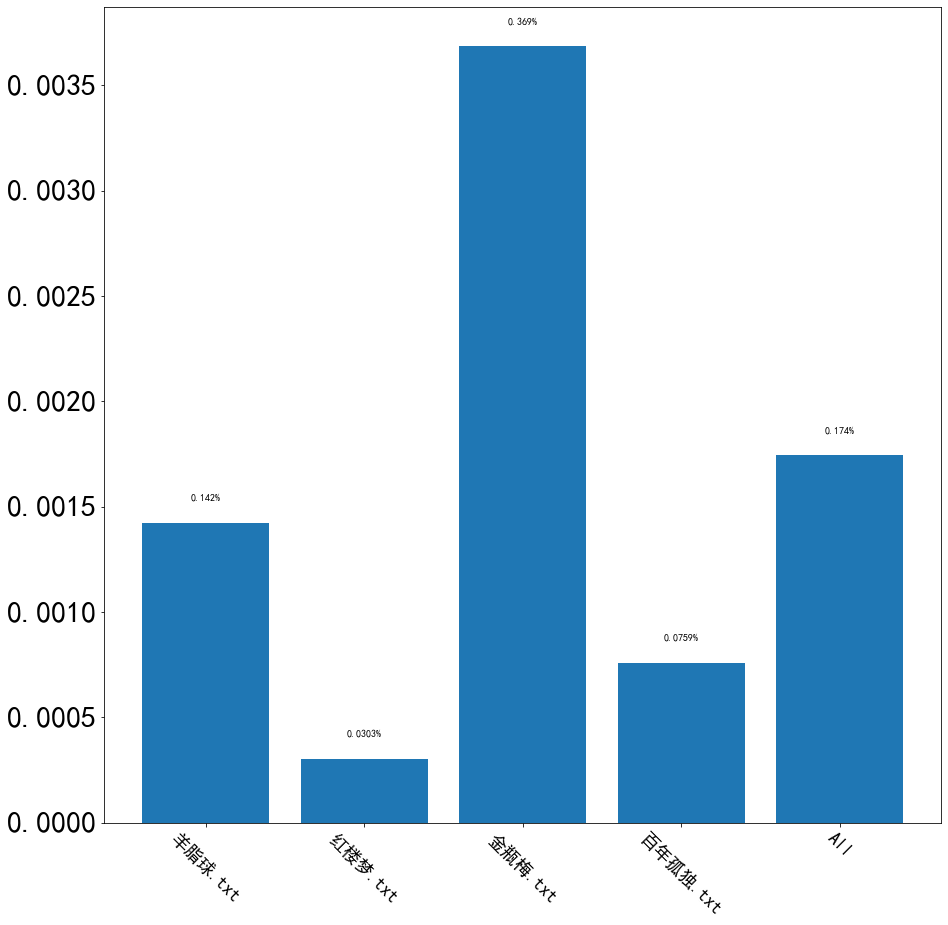

In [31]:
#分级标签
tags = [k for k in title_book_dict.keys()]
tags.append("All")
#数值：敏感词数 除以 总词数
values = [v[1]/s[1] for v,s in zip(title_sens_word_dict.values(), title_book_dict.values())]
values.append(len(book_sens_word_str.split())/all_book_str_cnt)
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=18,rotation=-45)
plt.yticks(fontsize=30)
plt.bar(tags, values)
for a,b in zip(tags, values):
    plt.text(a, b+0.0001, '{:.3}%'.format(b*100), ha='center', va='bottom')

## 创建并显示词云

#创建文章所有词云


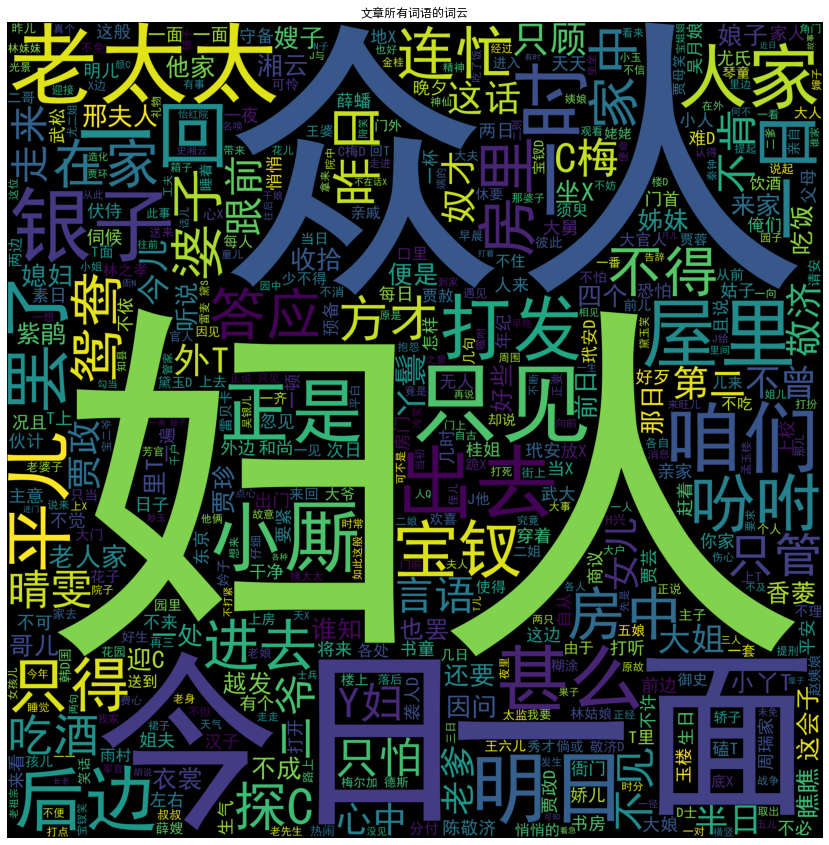

#创建文章所有敏感词的词云


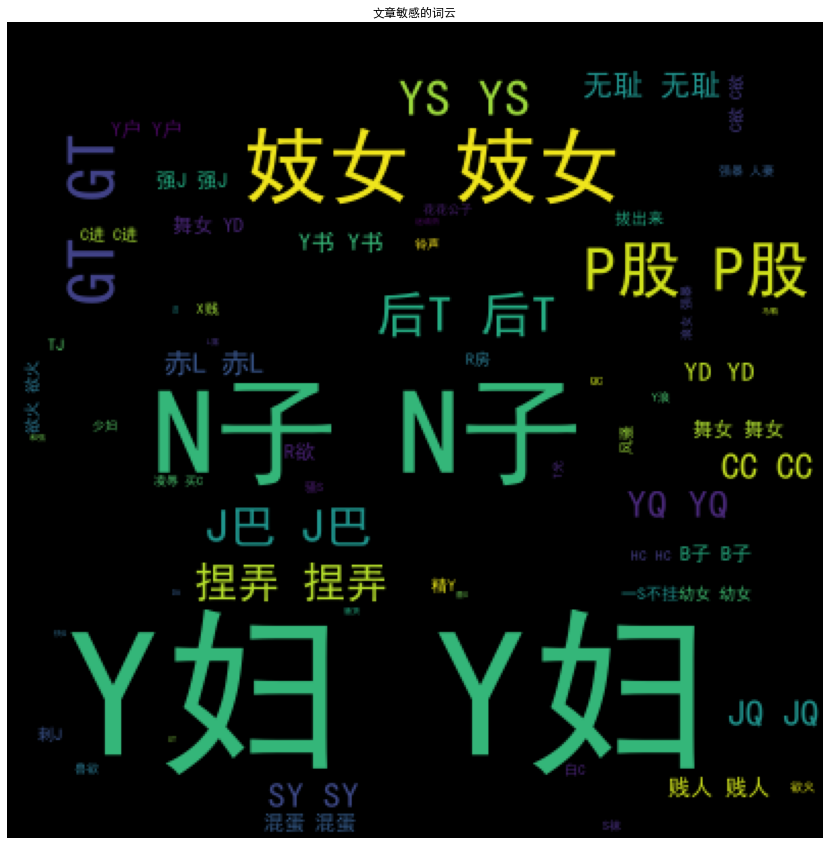

#创建分级文章所有词云


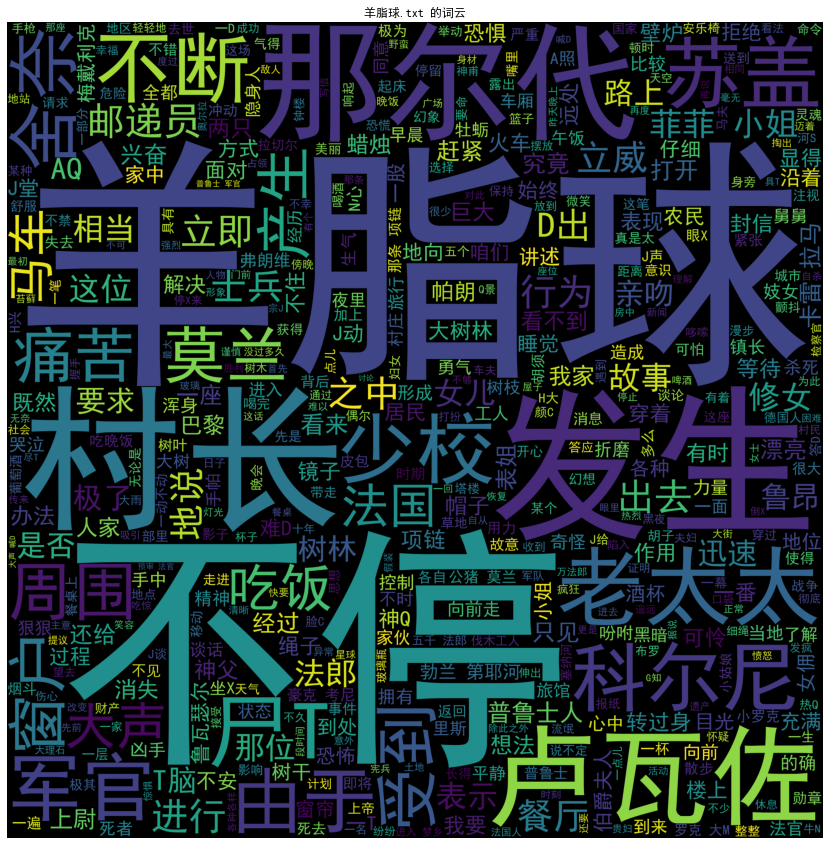

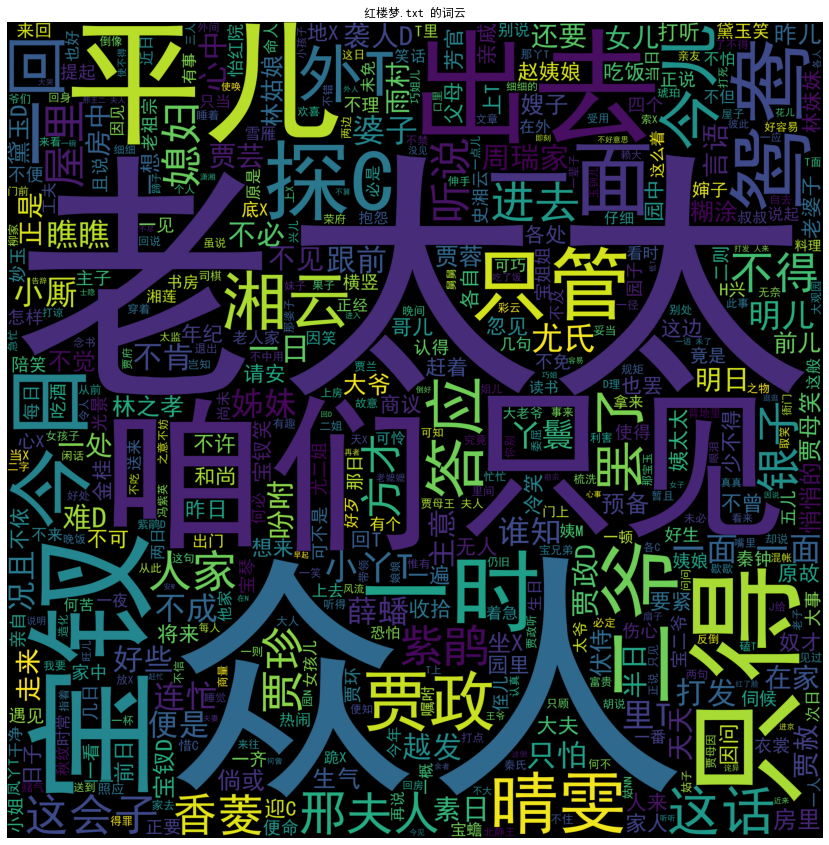

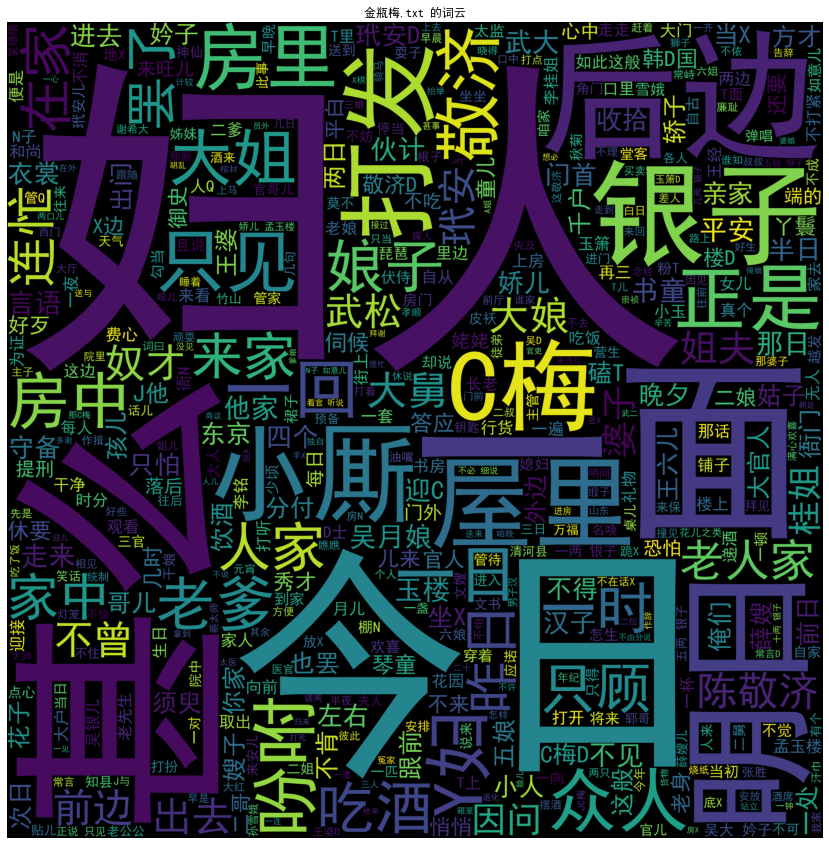

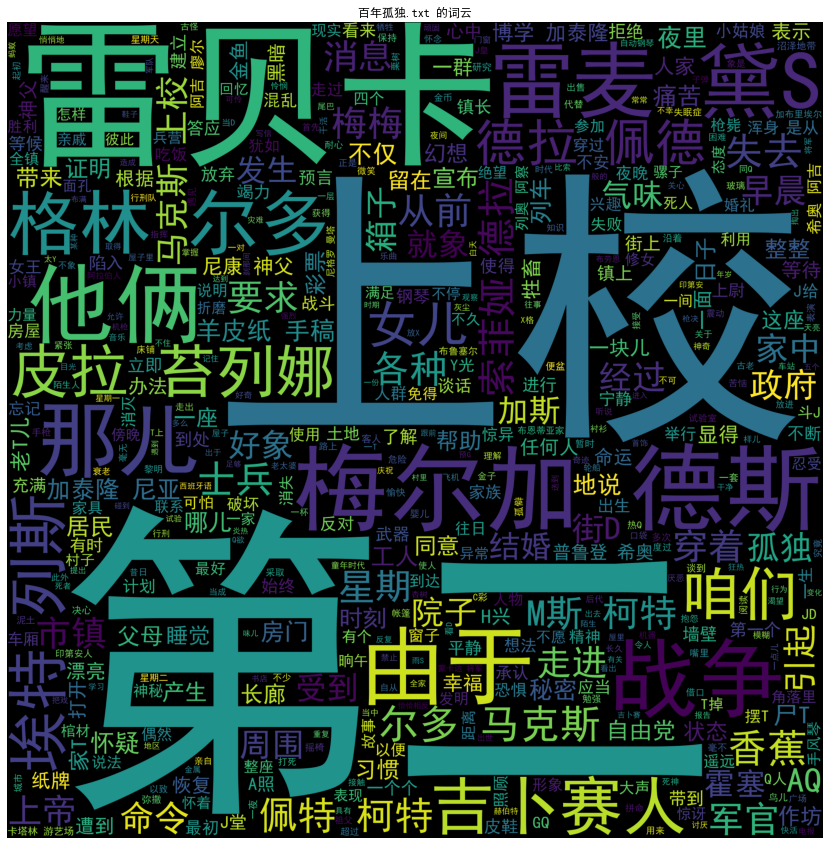

#创建分级文章敏感词的词云


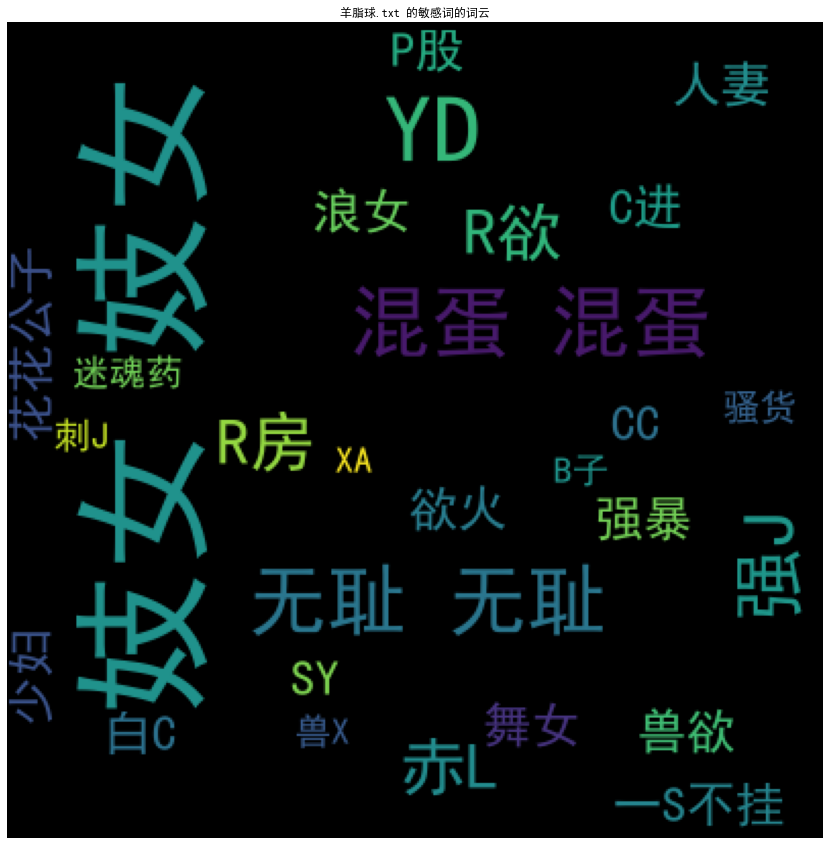

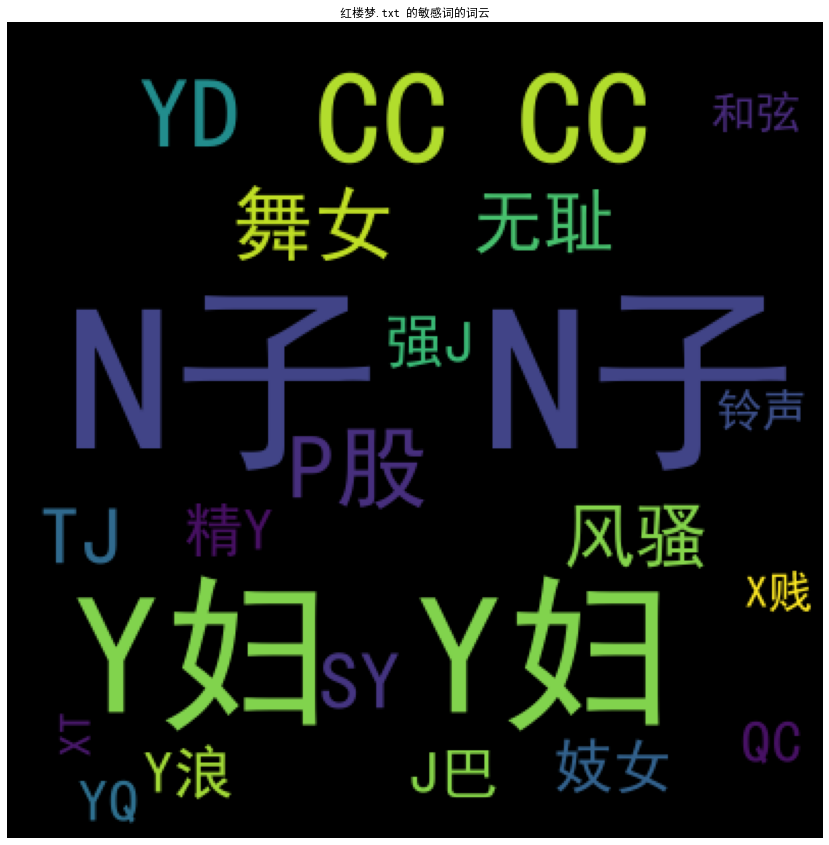

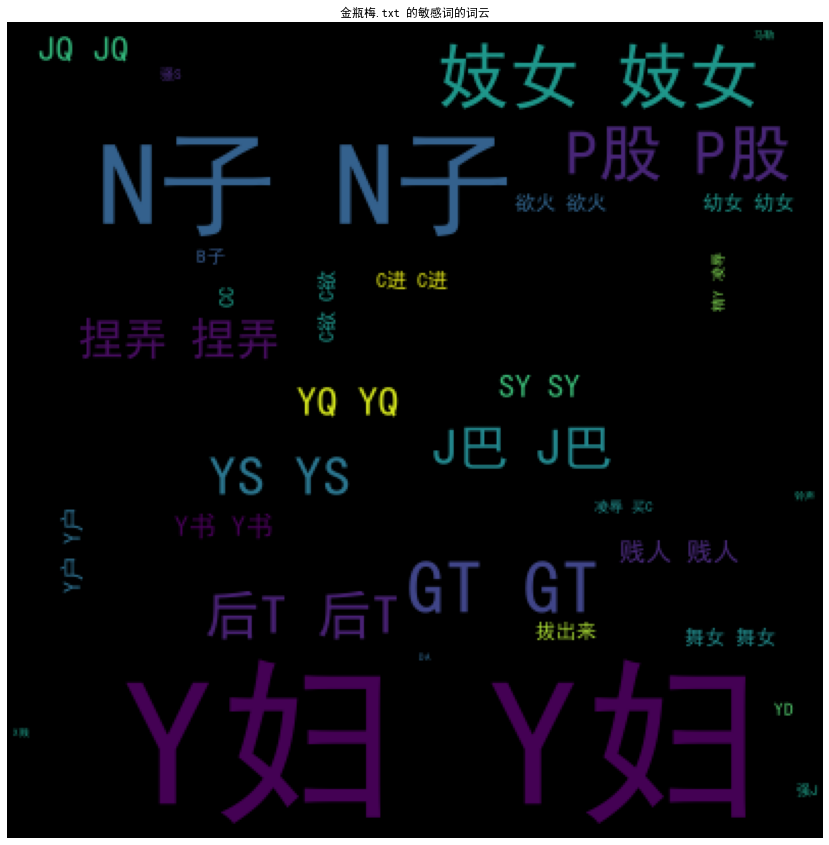

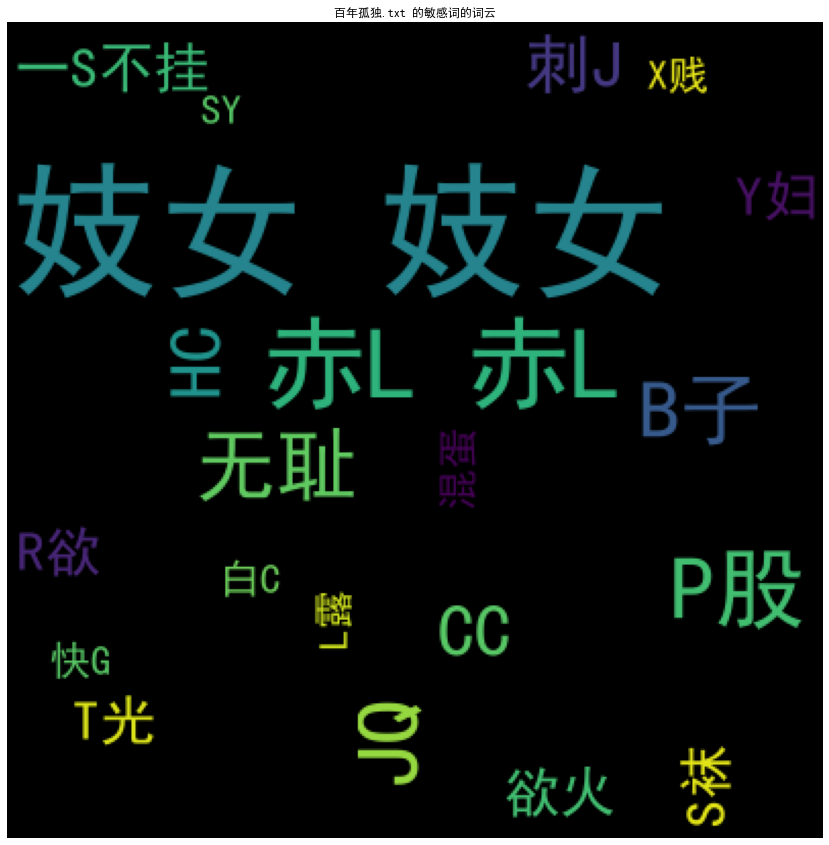

In [57]:
print("#创建文章所有词云")
all_wc = create_word_cloud(harm_text(all_book_str), 500) #"book_wordcloud.jpg"
plt.figure(figsize=(15,15)) 
plt.imshow(all_wc)
plt.axis("off")
plt.title("文章所有词语的词云")
plt.show()
print("#创建文章所有敏感词的词云")
sens_wc = create_word_cloud(harm_text(book_sens_word_str),100) #"book_sens_wordcloud.jpg"
plt.figure(figsize=(15,15)) 
plt.imshow(sens_wc)
plt.axis("off")
plt.title("文章敏感的词云")
plt.show()
print("#创建分级文章所有词云")
for k, word in title_book_dict.items():
    r_all_wc = create_word_cloud(harm_text(word[0]), 500) #k+"_wordcloud.jpg"
    plt.figure(figsize=(15,15)) 
    plt.imshow(r_all_wc)
    plt.axis("off")
    plt.title(k+" 的词云")
    plt.show()
print("#创建分级文章敏感词的词云")
for k, sens in title_sens_word_dict.items():
    r_sens_wc = create_word_cloud(harm_text(sens[0]),100) #k+"_sens_wordcloud.jpg"
    plt.figure(figsize=(15,15)) 
    plt.imshow(r_sens_wc)
    plt.axis("off")
    plt.title(k+" 的敏感词的词云")
    plt.show()

## 查看部分过滤词情况

In [ ]:
#拆分数据
keys = list(stop_words['bodypart'])
values = list(book_stop_cnt['bodypart'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据
keys = list(stop_words['color'])
values = list(book_stop_cnt['color'])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(keys, values)


#拆分数据
keys = list(stop_words['motion'])
values = list(book_stop_cnt['motion'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])
    
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据
keys = list(stop_words['site'])
values = list(book_stop_cnt['site'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据
keys = list(stop_words['orientation'])
values = list(book_stop_cnt['orientation'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据

keys = list(stop_words['role_name'])
values = list(book_stop_cnt['role_name'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(50):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])
    
#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=13,rotation=-70)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据
keys = list(stop_words['title'])
values = list(book_stop_cnt['title'])

#数据过多取排名靠前的数据
sub_keys = []
sub_values = []
sortindex = np.argsort(values)[::-1]
for i in range(len(sortindex)):
    sub_keys.append(keys[sortindex[i]])
    sub_values.append(values[sortindex[i]])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(sub_keys, sub_values)

#拆分数据
bodyparts = list(stop_words['thing'])
values = list(book_stop_cnt['thing'])

#画条形图
plt.figure(figsize=(15,15)) 
plt.xticks(fontsize=14,rotation=-60)
plt.yticks(fontsize=20)
plt.bar(bodyparts, values)